# 1.Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


from sklearn.feature_selection import SelectKBest
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from ydata_profiling import ProfileReport
from sklearn.metrics import f1_score

#KNN IMPUTER
from sklearn.impute import KNNImputer

#CROSS VALIDATION
from sklearn.model_selection import cross_val_score, StratifiedKFold

#ENCODING
from category_encoders import TargetEncoder
from sklearn.preprocessing import LabelEncoder

#DATA NORMALIZATION

#MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

# Robust Scaler
from sklearn.preprocessing import RobustScaler

#FEATURE SELECTION

#Filter Methods
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif

#Wrapper Methods
from sklearn.feature_selection import RFE

#Embedded Methods 
from sklearn.linear_model import LassoCV

#MODELS

#LogisticRegression
from sklearn.linear_model import LogisticRegression

#Naive Bayes 
from sklearn.naive_bayes import GaussianNB

#KNN Classifier
from sklearn.neighbors import KNeighborsClassifier

#MLP Classifier
from sklearn.neural_network import MLPClassifier

#Decision Trees
from sklearn.tree import DecisionTreeClassifier

#ENSEMBLE

#Random Forest
from sklearn.ensemble import RandomForestClassifier

#BaggingClassifier
from sklearn.ensemble import BaggingClassifier

#Boosting
from sklearn.ensemble import GradientBoostingClassifier

#AdaBoost
from sklearn.ensemble import AdaBoostClassifier

#Stacking
from sklearn.ensemble import StackingClassifier

#Voting
from sklearn.ensemble import VotingClassifier

from scipy import stats

from math import ceil


from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import StratifiedKFold
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
import time

#install mlxtend
#!pip install mlxtend

#import warnings
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve


**1.1 Import train and test data set**

In [2]:
df = pd.read_csv(r"C:\Users\carla\OneDrive\Ambiente de Trabalho\ML PROJECT 23\project_data\train.csv")
df

,encounter_id,country,patient_id,race,gender,age,weight,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,...,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_binary,readmitted_multiclass
0,533253,USA,70110,Caucasian,Female,[70-80),?,?,0,0,...,276,466,8,NaN,NaN,No,No,[],No,>30 days
1,426224,USA,29775006,AfricanAmerican,Male,[50-60),?,?,0,0,...,785,162,9,NaN,NaN,No,Yes,['insulin'],No,No
2,634063,USA,80729253,Caucasian,Female,[60-70),?,?,0,0,...,135,250,6,NaN,NaN,Ch,Yes,"['glimepiride', 'insulin']",No,No
3,890610,USA,2919042,AfricanAmerican,Male,[60-70),?,MC,0,0,...,562,455,5,NaN,NaN,No,No,[],No,No
4,654194,USA,84871971,Caucasian,Female,[70-80),?,HM,1,0,...,599,428,9,NaN,NaN,No,No,[],No,>30 days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71231,660160,USA,24531381,AfricanAmerican,Female,[80-90),?,MC,0,1,...,786,250,9,NaN,>7,Ch,Yes,"['metformin', 'glyburide', 'insulin']",No,No
71232,826429,USA,4663818,AfricanAmerican,Female,[70-80),?,?,0,0,...,197,V66,6,NaN,>7,Ch,Yes,"['metformin', 'glyburide']",No,No
71233,332030,USA,23397147,Caucasian,Female,[60-70),?,?,0,2,...,491,276,9,>300,NaN,Ch,Yes,"['glyburide', 'insulin']",Yes,<30 days
71234,757560,USA,52161750,Caucasian,Male,[60-70),?,BC,0,0,...,157,250.8,5,NaN,NaN,Ch,Yes,"['glyburide', 'insulin']",No,No


**Lab4**

**_Note_**: You should not use any information from the validation / test dataset to fill the missing values. 
Let's imagine that you have missing values on age and you want to fill those missing values with the median. You should compute the median value of age for the train dataset (suppose is 35) and fill the missing values in train, validation and test set (if available) with the median in the train dataset (35).

## 1.1 Train Test Split

In [3]:
# Define your target variable and features
X = df.drop(columns = ['readmitted_binary', 'readmitted_multiclass'], axis=1)  # Features
#y = df['readmitted_binary']  # Target variable
y = df['readmitted_multiclass']

# Split the train data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, 
                                                  y, 
                                                  test_size=0.2, 
                                                  random_state=42)

#X_train, X_val, y_train1, y_val1 = train_test_split(X, 
 #                                                 z, 
  #                                                test_size=0.2, 
   #                                               random_state=42)



## 1.2 Metadata

- *encounter_id* - Unique identifier of the encounter (ID visita) (numerical) (Set as index)

- *country* - country (Categorical)

- *patient_id* - Identifier of the patient (ID paciente)

- *race* - Patient’s race

- *gender* - Patient’s gender (Feature Engineering: Change to 1 and 0. It would be useful in future because gender seems to be an important feature to observ

- *age* - Patient’s age bracket (Problem: is type object)

- *weight* - Patient’s weight (Peso) (Problem: is type object)

- *payer_code* - Code of the health insurance provider (if there is one)
#Check missing-values
Check all dtypes

- *outpatient_visits_in_previous_year* - Number of outpatient visits (visits made with the intention of leaving on the same day) the patient made to the hospital in the year preceding the encounter
(Visitas diárias no mesmo ano: Consultas, Emergências?

- *emergency_visits_in_previous_year* - Number of emergency visits the patient made to the hospital in the year preceding the encounter

- *inpatient_visits_in_previous_year* - Number of inpatient visits (visits with the intention to stay overnight) the patient made to the hospital in the year preceding the encounter
(Visitas com intenção de ficar?)

- *admission_type* - Type of admission of the patient (e.g. Emergency, Urgent,etc…)
(Ver todos os admission types)

- *medical_specialty* - Medical specialty on which the patient was admitted
Ver as que existem

- *average_pulse_bpm* - Average pulse of the patient during their stay in the hospital in beats per minute

- *discharge_disposition* - Destination given to the patient after being discharged
(Destino após a alta?) Checkar os que há
Pode ter sido: casa, centro de reabilitação, lar, falecido

- *admission-source* - Source of the patient before being admitted in the current encounter
(Origem do paciente) Checkar o que há 
Emergência?
Clinica? Outro hospital?

- *length_of_stay_in_hospital* - Number of days between admission and discharge

- *number_lab_tests* - Number of lab tests performed during the encounter

- *non_lab_procedures* - Number of non-lab procedures performed during the encounter

- *number_of_medications* - Number of distinct types of medication administered during the encounter

- *primary_diagnosis* - Primary diagnosis (coded as first three digits of ICD9)
Ver os códigos que existem
- *secondary_diagnosis* - Secondary diagnosis (first three digits of ICD9)
Ver os códigos que existem
- *additional_diagnosis* - Additional secondary diagnosis (first three digits of ICD9)

- *number_diagnoses* - Number of diagnoses entered to the system

- *glucose_test_result* - Range of the glucose test results or if the test was not taken. Values: “>200,” “>300,” “normal,” and “none” if not measured
Feature Engineering?

- *a1c_test_result* - Range of the A1C test results or if the test was not taken.Values: “>8” if greater than 8%, “>7” if greater than 7% but less than 8%, “normal” if less than 7%, and “none” if not measured.
Feature Engineering?

- *change_in_meds_during_hospitalization* - Indicates if there was a change in diabetic medications (dosage or generic name). Values: “change” and “no change”
prescribed_diabetes_meds - Yes if patient has diabetes medication prescribed. No otherwise.
Verificar se está em boolean?

- *medication* - List containing all generic names for the medications prescribed to the patient during the encounter. Empty list if no medication was prescribed.
Ver todos os que existem

**Targets**
- *readmitted_binary* - Binary target: Yes if patient was readmitted in less than 30 days, No otherwise.

- *readmitted_multiclass* - Multiclass target: “<30 days” if the patient was readmitted in less than 30 days after discharge. “>30 days if the patient was readmitted to the hospital but only after more than 30 days after the current discharge. No otherwise.

# 2.Data Exploration

## 2.1 Checking dataset and dtypes

In [4]:
df.info() #71236 entries and 31 variables 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           71236 non-null  int64 
 1   country                                71236 non-null  object
 2   patient_id                             71236 non-null  int64 
 3   race                                   67682 non-null  object
 4   gender                                 71236 non-null  object
 5   age                                    67679 non-null  object
 6   weight                                 71236 non-null  object
 7   payer_code                             71236 non-null  object
 8   outpatient_visits_in_previous_year     71236 non-null  int64 
 9   emergency_visits_in_previous_year      71236 non-null  int64 
 10  inpatient_visits_in_previous_year      71236 non-null  int64 
 11  admission_type 

## 2.2 Checking missing values

In [5]:
#Check for missing values on train set
print(X_train.isna().sum())

# VERIFICAMOS QUE AS VARIÁVEIS glucose_test_result E a1c_test_result POSSUEM DEMASIADOS NA'S, LOGO VAMOS REMOVÊ-LAS
# EXISTEM NA'S EM MENOR QUANTIDADE NAS VAR: race, age, admission_type, discharge_disposition, admission_source

encounter_id                                 0
country                                      0
patient_id                                   0
race                                      2805
gender                                       0
age                                       2827
weight                                       0
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2966
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     2078
admission_source                          3769
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_dia

In [6]:
#Check for missing values on val set
print(X_val.isna().sum())

encounter_id                                 0
country                                      0
patient_id                                   0
race                                       749
gender                                       0
age                                        730
weight                                       0
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                             740
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                      512
admission_source                           949
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_dia

## 2.3 Descriptive Statistics

In [7]:
X_train.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
encounter_id,56988.0,NaN,NaN,NaN,548710.125219,259893.814793,100000.0,322854.25,547261.5,774720.5,999980.0
country,56988,1,USA,56988,NaN,NaN,NaN,NaN,NaN,NaN,NaN
patient_id,56988.0,NaN,NaN,NaN,54394273.120604,38817247.097834,135.0,23398488.0,45441346.5,87726521.25,189502619.0
race,54183,6,Caucasian,40524,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,56988,3,Female,30601,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,54161,10,[70-80),13906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weight,56988,10,?,55165,NaN,NaN,NaN,NaN,NaN,NaN,NaN
payer_code,56988,18,?,22529,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.368464,1.28641,0.0,0.0,0.0,0.0,42.0
emergency_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.19483,0.888386,0.0,0.0,0.0,0.0,76.0


In [8]:
print(y_train.isna().sum())

0


In [9]:
# replace "" by nans
X_train.replace("", np.nan, inplace=True)
X_val.replace("", np.nan, inplace=True)

In [10]:
X_train['non_lab_procedures'].value_counts()

non_lab_procedures
0    26036
1    11661
2     7148
3     5289
6     2783
4     2363
5     1708
Name: count, dtype: int64

## 2.4 Checking % of ?

In [11]:
#Check the % of values in each feature that are equal to ?
#Train
print("Porcentagens no Conjunto de Treino:")
print("Race:", (len(X_train.loc[X_train['race'] == '?']) / len(X_train)) * 100)
print("Weight:", (len(X_train.loc[X_train['weight'] == '?']) / len(X_train)) * 100)
print("Payer Code:", (len(X_train.loc[X_train['payer_code'] == '?']) / len(X_train)) * 100)
print("Medical Specialty:", (len(X_train.loc[X_train['medical_specialty'] == '?']) / len(X_train)) * 100)
print("Primary Diagnosis:", (len(X_train.loc[X_train['primary_diagnosis'] == '?']) / len(X_train)) * 100)
print("Secondary Diagnosis:", (len(X_train.loc[X_train['secondary_diagnosis'] == '?']) / len(X_train)) * 100)
print("Additional Diagnosis:", (len(X_train.loc[X_train['additional_diagnosis'] == '?']) / len(X_train)) * 100)

# VAl
print("\nPorcentagens no Conjunto de Validação:")
print("Race:", (len(X_val.loc[X_val['race'] == '?']) / len(X_val)) * 100)
print("Weight:", (len(X_val.loc[X_val['weight'] == '?']) / len(X_val)) * 100)
print("Payer Code:", (len(X_val.loc[X_val['payer_code'] == '?']) / len(X_val)) * 100)
print("Medical Specialty:", (len(X_val.loc[X_val['medical_specialty'] == '?']) / len(X_val)) * 100)
print("Primary Diagnosis:", (len(X_val.loc[X_val['primary_diagnosis'] == '?']) / len(X_val)) * 100)
print("Secondary Diagnosis:", (len(X_val.loc[X_val['secondary_diagnosis'] == '?']) / len(X_val)) * 100)
print("Additional Diagnosis:", (len(X_val.loc[X_val['additional_diagnosis'] == '?']) / len(X_val)) * 100)


Porcentagens no Conjunto de Treino:
Race: 2.147820593809223
Weight: 96.80108092931845
Payer Code: 39.53288411595424
Medical Specialty: 49.10682950796659
Primary Diagnosis: 0.02456657541938654
Secondary Diagnosis: 0.3684986312907981
Additional Diagnosis: 1.4266161297115183

Porcentagens no Conjunto de Validação:
Race: 2.0494104435710274
Weight: 97.03116226838856
Payer Code: 39.809096013475575
Medical Specialty: 48.68753509264458
Primary Diagnosis: 0.014037057832678272
Secondary Diagnosis: 0.36496350364963503
Additional Diagnosis: 1.3686131386861315


## 2.5 Checking for duplicated values

In [12]:
print(X_train.duplicated().sum())
print(X_val.duplicated().sum())

0
0


## 2.6 Checking if we have readmitted patients

In [13]:
# Unique patient_id values in the training and validation sets
train_patient_ids = X_train['patient_id'].unique()
val_patient_ids = X_val['patient_id'].unique()

# Initialize counters for the training set
count_age_train = 0
count_admission_type_train = 0
count_discharge_disposition_train = 0
count_admission_source_train = 0

# Iterate over unique values in the training set
for i in train_patient_ids:
    if len(X_train[X_train['patient_id'] == i]) > 1:
        dff = X_train[X_train['patient_id'] == i]
        if dff['age'].isnull().values.any():
            count_age_train += dff['age'].isnull().sum()
        if dff['admission_type'].isnull().values.any():
            count_admission_type_train += dff['admission_type'].isnull().sum()
        if dff['discharge_disposition'].isnull().values.any():
            count_discharge_disposition_train += dff['discharge_disposition'].isnull().sum()
        if dff['admission_source'].isnull().values.any():
            count_admission_source_train += dff['admission_source'].isnull().sum()

# Initialize counters for the validation set
count_age_val = 0
count_admission_type_val = 0
count_discharge_disposition_val = 0
count_admission_source_val = 0

# Iterate over unique values in the validation set
for i in val_patient_ids:
    if len(X_val[X_val['patient_id'] == i]) > 1:
        dff = X_val[X_val['patient_id'] == i]
        if dff['age'].isnull().values.any():
            count_age_val += dff['age'].isnull().sum()
        if dff['admission_type'].isnull().values.any():
            count_admission_type_val += dff['admission_type'].isnull().sum()
        if dff['discharge_disposition'].isnull().values.any():
            count_discharge_disposition_val += dff['discharge_disposition'].isnull().sum()
        if dff['admission_source'].isnull().values.any():
            count_admission_source_val += dff['admission_source'].isnull().sum()

# Print results for both sets
print("Training Set:")
print(count_admission_source_train, count_admission_type_train, count_age_train, count_discharge_disposition_train)

print("\nValidation Set:")
print(count_admission_source_val, count_admission_type_val, count_age_val, count_discharge_disposition_val)


Training Set:
1219 568 947 780

Validation Set:
116 57 105 76


In [14]:
print(X_train.isna().sum())
\
print(X_val.isna().sum())

encounter_id                                 0
country                                      0
patient_id                                   0
race                                      2805
gender                                       0
age                                       2827
weight                                       0
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2966
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     2078
admission_source                          3769
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_dia

In [15]:
X_train1 = X_train.copy()
X_val1 = X_val.copy()


# 3.Data Pre-Processing

## 3.1 Initial Drops

In [16]:
# REMOVEMOS AS VARIÁVEIS QUE NÃO NOS INTERESSAM
# CONSEGUIMOS VERIFICAR QUE EXISTEM UM NÚMERO EXCESSIVO DE "?" (40% A 96%) NAS VARIÁVEIS: weight, payer_code e medical_specialty
# VAMOS PORTANTO ELIMINAR ESTAS COLUNAS
X_train1 = X_train1.drop(['country', 'weight', 'payer_code' ], axis=1)
X_val1 = X_val1.drop(['country', 'weight', 'payer_code'], axis=1)

X_train1.head()


,encounter_id,patient_id,race,gender,age,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,...,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication
43545,613653,85248135,Caucasian,Female,[50-60),0,0,2,Urgent,?,...,16,250.6,682,707,9,NaN,NaN,Ch,Yes,"['rosiglitazone', 'insulin']"
30779,508846,97887789,Caucasian,Male,[80-90),0,0,0,Elective,?,...,28,812,428,E880,9,NaN,NaN,No,Yes,['pioglitazone']
64909,615897,3677022,Caucasian,Female,[20-30),0,0,2,Urgent,ObstetricsandGynecology,...,3,648,250.03,785,5,NaN,NaN,No,Yes,['insulin']
30302,234535,137342687,Caucasian,Female,[70-80),0,0,0,Emergency,?,...,13,435,401,250,5,NaN,NaN,Ch,Yes,['insulin']
53951,672329,42027282,Caucasian,Female,[70-80),1,0,2,Emergency,?,...,12,805,427,428,9,NaN,NaN,Ch,Yes,"['pioglitazone', 'glyburide-metformin']"


## 3.2 Replace 'Unknown/Invalid' in 'gender' with the mode

In [17]:
# Replace 'Unknown/Invalid' in 'gender' with the mode value
mode_gender_train = X_train1['gender'].mode()[0]
value_to_replace = 'Unknown/Invalid'
X_train1.loc[X_train1['gender'] == value_to_replace, 'gender'] = mode_gender_train
X_val1.loc[X_val1['gender'] == value_to_replace, 'gender'] = mode_gender_train

In [18]:
X_train2 = X_train1.copy()
X_val2 = X_val1.copy()

## 3.3 Replace nan values in readmitedd pacients with value of last visit

In [19]:
#This means that we have some patients that were admitted more than once. 
#It is most likely that the admission_source and admission_type 
#is the same as well with age as its a range of 10 years and discharge disposition. 
#So instead of mode for some we add the ones that have value already.
#The following is not the best code but it works :')

# Resetar índices dos conjuntos de treino e validação
X_train2 = X_train2.reset_index(drop=True)
X_val2 = X_val2.reset_index(drop=True)

nan_values = ['age', 'race', 'admission_type', 'discharge_disposition', 'admission_source']

# Iterate over unique patient_ids in the training set
for i in train_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) > 1:
        dff = X_train2[X_train2['patient_id'] == i]
        for j in nan_values:
            if dff[j].isnull().values.any() and len(dff[j]) != dff[j].isnull().sum():
                indexes_nan = dff[dff[j].isnull()].index
                indexes = dff[dff[j].notnull()].index
                if indexes.any():
                    X_train2.loc[indexes_nan, j] = X_train2.loc[indexes[0], j]
                    
for i in val_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) >= 1:
        dff = X_train2[X_train2['patient_id'] == i]
        df_null = X_val2[X_val2['patient_id'] == i]
        for j in nan_values:
            dff2 = dff[dff[j].notnull()]
            if len(dff2)>=1 and df_null[j].isnull().sum()>=1:
                indexes_nan = df_null[df_null[j].isnull()].index
                if indexes_nan.any():
                    X_val2[j].iloc[indexes_nan] = dff2[j].values[0]


## 3.4 Replace ? values in readmitedd pacients with value of last visit

In [20]:
#Lets try this also with the ? values and see what we find. 

values_change = ['race', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'medical_specialty']

# Training set
for i in train_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) > 1:
        dff = X_train2[X_train2['patient_id'] == i]
        for j in values_change:
            num_value = len(dff[j].loc[dff[j] == '?'])
            if num_value > 0 and len(dff[j]) != num_value:
                indexes_nan = X_train2.loc[(X_train2['patient_id'] == i) & (X_train2[j].str.contains('?', regex=False, na=False))].index
                indexes = X_train2.loc[(X_train2['patient_id'] == i) & (~X_train2[j].str.contains('?', regex=False, na=False))].index
                X_train2[j].iloc[indexes_nan] = X_train2[j].iloc[indexes[0]]
                
for i in val_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) >= 1:
        dff = X_train2[X_train2['patient_id'] == i]
        df_null = X_val2[X_val2['patient_id'] == i]
        for j in nan_values:
            dff2 = dff[dff[j]!='?']
            
            if len(dff2)>=1 and len(df_null[j].loc[df_null[j]=='?'])>=1:
                indexes_nan = df_null.loc[df_null[j]=='?'].index
                if indexes_nan.any():
                    X_val2[j].iloc[indexes_nan] = dff2[j].values[0]



## 3.5. Replacing ? with mode on race

In [21]:
columns_to_replace = ['race']

for column in columns_to_replace:
    X_train2[column] = X_train2[column].str.strip()  
    mode_value = X_train2[column].mode()[0]  
    X_train2[column] = X_train2[column].replace('?', mode_value)

for column in columns_to_replace:
    X_val2[column] = X_val2[column].str.strip()  
    mode_value = X_val2[column].mode()[0]  
    X_val2[column] = X_val[column].replace('?', mode_value)

## 3.6 Replace Missing Values with the mode in race and age

In [22]:
#Fill nans with mode
for column in ['race', 'age']:
    mode_value = X_train2[column].mode()[0]
    X_train2[column].fillna(mode_value, inplace=True)
    X_val2[column].fillna(mode_value, inplace=True)

## 3.7 Replace Missing Values with 'Not Saved' on AT, DD, AS

In [23]:
X_train2['admission_type'].fillna('not_saved', inplace=True)
X_train2['discharge_disposition'].fillna('not_saved', inplace=True)
X_train2['admission_source'].fillna('not_saved', inplace=True)

X_val2['admission_type'].fillna('not_saved', inplace=True)
X_val2['discharge_disposition'].fillna('not_saved', inplace=True)
X_val2['admission_source'].fillna('not_saved', inplace=True)

## 3.8 Categorical Variables Aggregation

### 3.7.1 Discharge Dispostion

In [24]:
X_train2['discharge_disposition'].value_counts()

discharge_disposition
Discharged to home                                                                                           34031
Discharged/transferred to SNF                                                                                 7852
Discharged/transferred to home with home health service                                                       7327
not_saved                                                                                                     1645
Discharged/transferred to another short term hospital                                                         1197
Discharged/transferred to another rehab fac including rehab units of a hospital .                             1121
Expired                                                                                                        929
Discharged/transferred to another type of inpatient care institution                                           677
Not Mapped                                                

In [25]:
X_train2['discharged_home_binary'] = X_train2['discharge_disposition'].apply(lambda x: 0 if x == 'Discharged to home' else 1)
X_val2['discharged_home_binary'] = X_val2['discharge_disposition'].apply(lambda x: 0 if x == 'Discharged to home' else 1)

X_train2 = X_train2.drop('discharge_disposition', axis=1)
X_val2 = X_val2.drop('discharge_disposition', axis=1)


In [26]:
X_train2['discharged_home_binary'].value_counts()

discharged_home_binary
0    34031
1    22957
Name: count, dtype: int64

### 3.7.2 Admission Type

In [27]:
X_train2['admission_type'].value_counts()

admission_type
Emergency        30266
Elective         10651
Urgent           10457
not_saved         2736
Not Available     2688
Not Mapped         175
Trauma Center       10
Newborn              5
Name: count, dtype: int64

In [28]:
# Define the categories to keep
categories_to_keep = ["Emergency", "Elective", "Urgent"]

# Function to apply to each element in the 'admission_type' column
def categorize_admission_type(admission_type):
    if admission_type in categories_to_keep:
        return admission_type
    else:
        return 'Other'

# Applying the function to each element in the 'admission_type' column of both X_train2 and X_val2
X_train2['admission_type'] = X_train2['admission_type'].apply(categorize_admission_type)
X_val2['admission_type'] = X_val2['admission_type'].apply(categorize_admission_type)

In [29]:
X_train2['admission_type'].value_counts()

admission_type
Emergency    30266
Elective     10651
Urgent       10457
Other         5614
Name: count, dtype: int64

### 3.7.3 Admission Source

In [30]:
X_train2['admission_source'].value_counts()

admission_source
 Emergency Room                                               32206
 Physician Referral                                           16624
not_saved                                                      3741
Transfer from a hospital                                       1784
 Transfer from another health care facility                    1255
Clinic Referral                                                 606
 Transfer from a Skilled Nursing Facility (SNF)                 489
HMO Referral                                                    104
 Not Mapped                                                      87
 Not Available                                                   67
 Court/Law Enforcement                                            8
 Transfer from hospital inpt/same fac reslt in a sep claim        7
 Transfer from critial access hospital                            5
 Transfer from Ambulatory Surgery Center                          2
 Extramural Birth              

In [31]:
categories_to_transform = [
    'Transfer from a hospital',
    ' Transfer from another health care facility',
    'Clinic Referral',
    ' Transfer from a Skilled Nursing Facility (SNF)',
    'HMO Referral',
    ' Not Mapped',
    ' Not Available',
    ' Court/Law Enforcement',
    ' Transfer from critial access hospital',
    ' Transfer from hospital inpt/same fac reslt in a sep claim',
    ' Extramural Birth',
    ' Transfer from Ambulatory Surgery Center',
    ' Sick Baby',
    'Normal Delivery',
    'not_saved'
]

X_train2['admission_source'] = X_train2['admission_source'].apply(lambda x: 'Other' if x in categories_to_transform else x)

X_val2['admission_source'] = X_val2['admission_source'].apply(lambda x: 'Other' if x in categories_to_transform else x)




In [32]:
X_train2['admission_source'].value_counts()

admission_source
 Emergency Room        32206
 Physician Referral    16624
Other                   8158
Name: count, dtype: int64

### 3.7.4 Medical Specilaty

In [33]:
# First, determine the top 5 specialties from X_train2
top_5_specialties = X_train2['medical_specialty'].value_counts().nlargest(5).index

# Function to apply to each element in the 'medical_specialty' column
def categorize_specialty(specialty):
    if specialty in top_5_specialties and specialty != "?":
        return specialty
    else:
        return 'Not Saved'

# Applying the function to each element in the 'medical_specialty' column of both X_train2 and X_val2
X_train2['medical_specialty'] = X_train2['medical_specialty'].apply(categorize_specialty)
X_val2['medical_specialty'] = X_val2['medical_specialty'].apply(categorize_specialty)

### 3.7.5 Medication

In [34]:
X_train2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           56988 non-null  int64 
 1   patient_id                             56988 non-null  int64 
 2   race                                   56988 non-null  object
 3   gender                                 56988 non-null  object
 4   age                                    56988 non-null  object
 5   outpatient_visits_in_previous_year     56988 non-null  int64 
 6   emergency_visits_in_previous_year      56988 non-null  int64 
 7   inpatient_visits_in_previous_year      56988 non-null  int64 
 8   admission_type                         56988 non-null  object
 9   medical_specialty                      56988 non-null  object
 10  average_pulse_bpm                      56988 non-null  int64 
 11  admission_sourc

In [35]:
X_train2['Medicated_Status'] = X_train2['medication'].apply(lambda x: 'Medicated' if len(x) == 2 else 'Not Medicated')
X_val2['Medicated_Status'] = X_val2['medication'].apply(lambda x: 'Medicated' if len(x) == 2 else 'Not Medicated')

X_train2 = X_train2.drop('medication', axis=1)
X_val2 = X_val2.drop('medication', axis=1)

### 3.8.6 Age Mapping

In [36]:
age_mapping = {
    '[0-10)': 'child',
    '[10-20)': 'child',
    '[20-30)': 'adult',
    '[30-40)': 'adult',
    '[40-50)': 'adult',
    '[50-60)': 'adult',
    '[60-70)': 'elderly',
    '[70-80)': 'elderly',
    '[80-90)': 'elderly',
    '[90-100)': 'elderly', 
}

X_train2['age'] = X_train2['age'].map(age_mapping)
X_val2['age'] = X_val2['age'].map(age_mapping)


### 3.8.7 a1c_test_result 

In [37]:
a1c_mapping = {
    '>7': 'NotNormal',
    '>8': 'NotNormal',
    'Norm': 'Norm',
    np.nan: 'NotMeasured'  
}

X_train2['a1c_test_result'] = X_train2['a1c_test_result'].map(a1c_mapping)
X_val2['a1c_test_result'] = X_val2['a1c_test_result'].map(a1c_mapping)

### 3.8.8 glucose_test_result

In [38]:
glucose_mapping = {
    '>200': 'NotNormal',
    '>300': 'NotNormal',
    'Norm': 'Normal',
    np.nan: 'NotMeasured' 
}

X_train2['glucose_test_result'] = X_train2['glucose_test_result'].map(glucose_mapping)
X_val2['glucose_test_result'] = X_val2['glucose_test_result'].map(glucose_mapping)

## 3.8 Descriptive Statistics II

In [39]:
X_train3 = X_train2.copy()
X_val3 = X_val2.copy()

In [40]:
X_train3.describe(include= 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
encounter_id,56988.0,NaN,NaN,NaN,548710.125219,259893.814793,100000.0,322854.25,547261.5,774720.5,999980.0
patient_id,56988.0,NaN,NaN,NaN,54394273.120604,38817247.097834,135.0,23398488.0,45441346.5,87726521.25,189502619.0
race,56988,5,Caucasian,44321,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,56988,2,Female,30604,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,56988,3,elderly,39039,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.368464,1.28641,0.0,0.0,0.0,0.0,42.0
emergency_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.19483,0.888386,0.0,0.0,0.0,0.0,76.0
inpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.64131,1.27662,0.0,0.0,0.0,1.0,21.0
admission_type,56988,4,Emergency,30266,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,56988,5,Not Saved,36524,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
X_val3.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
encounter_id,14248.0,NaN,NaN,NaN,549152.592855,258955.827557,100078.0,324639.5,551748.5,771545.25,999968.0
patient_id,14248.0,NaN,NaN,NaN,53934329.998947,38709325.043489,1152.0,23384634.75,44679307.5,87021364.5,188703698.0
race,14248,5,Caucasian,13638,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,14248,2,Female,7627,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,14248,3,elderly,9785,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.374088,1.291731,0.0,0.0,0.0,0.0,29.0
emergency_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.201923,0.995676,0.0,0.0,0.0,0.0,63.0
inpatient_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.635528,1.229201,0.0,0.0,0.0,1.0,19.0
admission_type,14248,4,Emergency,7605,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,14248,5,Not Saved,9270,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 4.Visualizations

In [42]:
X_train4 = X_train3.copy()
X_val4 = X_val3.copy()

In [43]:
# THIS GRAPH SHOWS THAT ONLY 17% OF THE VISITS WERE MADE WITH INTENTION TO LEAVE

#data = [57315, 68697-57315] 
#labels = ['Visitas = 0', 'Visitas > 0']
#colors = sns.color_palette('pastel')
#sns.set(font_scale = 1.2)
#plt.title('Number of Visits In the Previous Year \nWith Intention to Leave the Hospital')
#plt.pie(data, labels=labels,colors = colors, autopct = '%0.0f%%')
#plt.show()

## 4.1 Split in metric and non-metric features

In [44]:
non_metric_features_train4 = []
metric_features_train4 = []

#X_train4
for col in X_train4.columns:
    if X_train4[col].dtype == 'object':
        non_metric_features_train4.append(col)
    elif X_train4[col].dtype == 'int64':
        metric_features_train4.append(col)

print("Non-metric features in X_train4:", non_metric_features_train4)
print("Metric features in X_train4:", metric_features_train4)

#X_val4
non_metric_features_val4 = []
metric_features_val4 = []

for col in X_val4.columns:
    if X_val4[col].dtype == 'object':
        non_metric_features_val4.append(col)
    elif X_val4[col].dtype == 'int64':
        metric_features_val4.append(col)

print("Non-metric features in X_val4:", non_metric_features_val4)
print("Metric features in X_val4:", metric_features_val4)


Non-metric features in X_train4: ['race', 'gender', 'age', 'admission_type', 'medical_specialty', 'admission_source', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'Medicated_Status']
Metric features in X_train4: ['encounter_id', 'patient_id', 'outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'average_pulse_bpm', 'length_of_stay_in_hospital', 'number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'number_diagnoses', 'discharged_home_binary']
Non-metric features in X_val4: ['race', 'gender', 'age', 'admission_type', 'medical_specialty', 'admission_source', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'Medicated_Status']
Metric features in X_val4: ['enc

## 4.2 Correlation Matrix

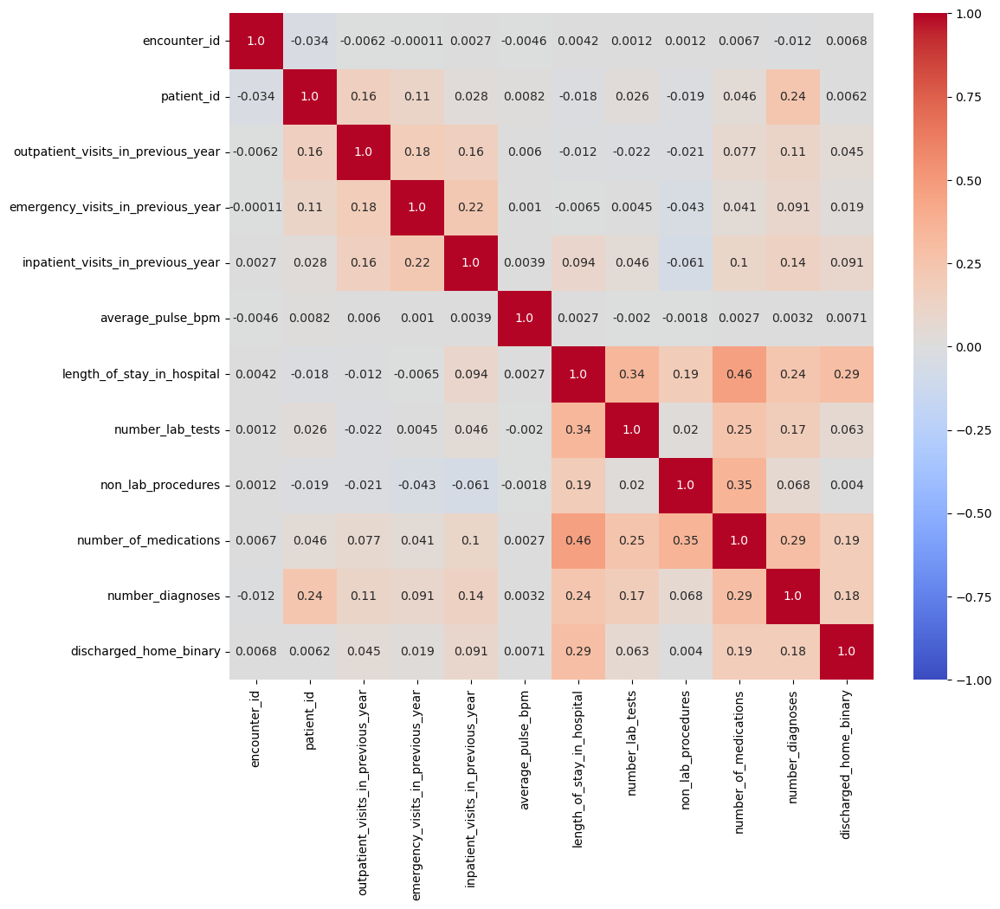

In [45]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, vmin=-1, vmax=1, annot = True, cmap="coolwarm", fmt='.2')
    plt.show()

cor_spearman_train4 = X_train4[metric_features_train4].corr(method='spearman')
cor_heatmap(cor_spearman_train4)
# LEN OF STAY IN HOSPITAL AND NUMBER OF MEDICATIONS ARE THE MOST CORRELATED FEATURES (50%)

## 4.3 Numeric Variables Histogram

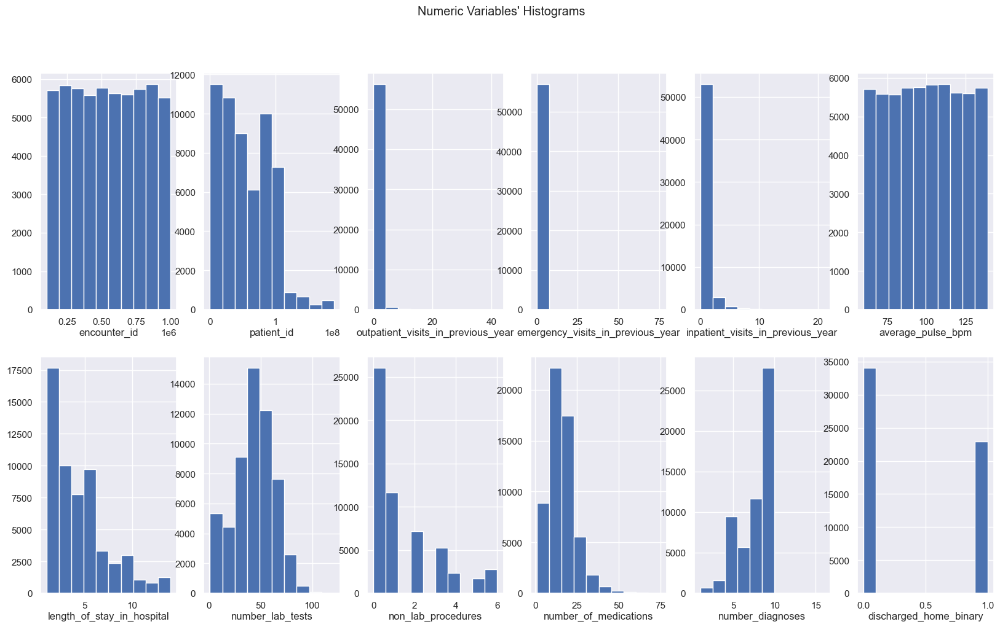

In [46]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features_train4) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features_train4): # Notice the zip() function and flatten() method
    ax.hist(X_train4[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

## 4.4 Numerical Variables BoxPlots

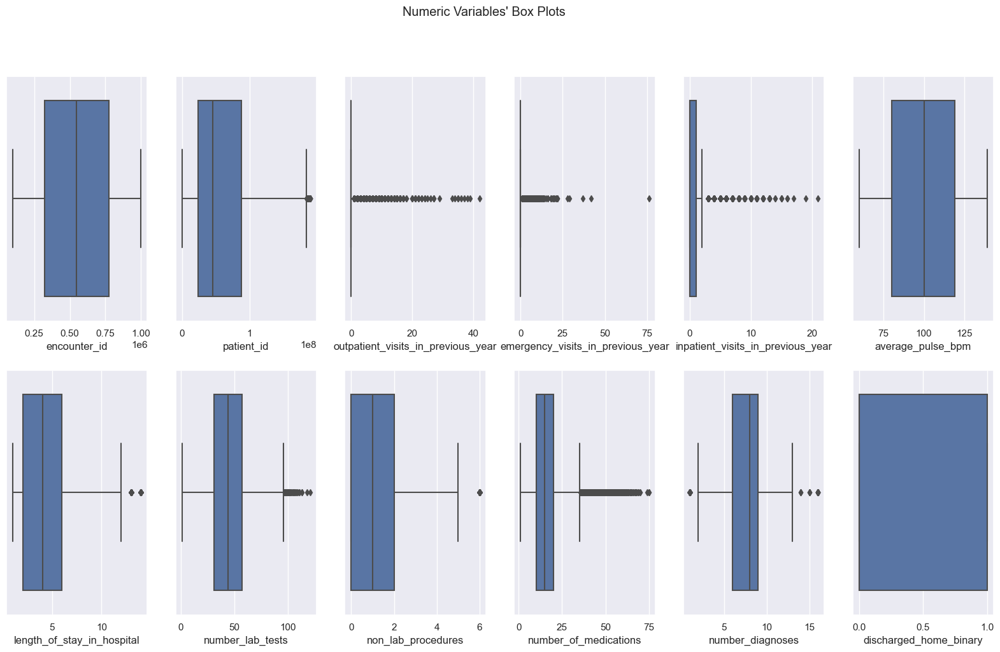

In [47]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features_train4) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features_train4): # Notice the zip() function and flatten() method
    sns.boxplot(x=X_train4[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

## 4.5 Pairwise Relationship of Numerical Variables against ReadmittedBinary

In [48]:
# Pairwise Relationship of Numerical Variables
#sns.set()

# Setting pairplot
#sns.pairplot(df[metric_features + ['readmitted_binary']], diag_kind="hist", hue='readmitted_binary')

# Layout
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables against Readmitted_Binary", fontsize=20)

#plt.show()

# 5.Feature Engineering

In [49]:
X_train6 = X_train4.copy()
X_val6 = X_val4.copy()

In [50]:
X_train6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           56988 non-null  int64 
 1   patient_id                             56988 non-null  int64 
 2   race                                   56988 non-null  object
 3   gender                                 56988 non-null  object
 4   age                                    56988 non-null  object
 5   outpatient_visits_in_previous_year     56988 non-null  int64 
 6   emergency_visits_in_previous_year      56988 non-null  int64 
 7   inpatient_visits_in_previous_year      56988 non-null  int64 
 8   admission_type                         56988 non-null  object
 9   medical_specialty                      56988 non-null  object
 10  average_pulse_bpm                      56988 non-null  int64 
 11  admission_sourc

## 5.1 Number of visits

In [51]:
X_train6['number_of_visits'] = X_train6.groupby('patient_id')['encounter_id'].transform('count')
X_val6['number_of_visits'] = X_val6.groupby('patient_id')['encounter_id'].transform('count')

X_train6.drop(columns=["patient_id", "encounter_id"], inplace=True)
X_val6.drop(columns=["patient_id", "encounter_id"], inplace=True)

## 5.2 Total Procedures

In [52]:
X_train6['procedures'] = X_train6['non_lab_procedures'] + X_train6['number_of_medications'] + X_train6['number_lab_tests']
X_val6['procedures'] = X_val6['non_lab_procedures'] + X_val6['number_of_medications'] + X_val6['number_lab_tests']

X_train6.drop(columns=["non_lab_procedures", "number_of_medications", "number_lab_tests"], inplace=True)
X_val6.drop(columns=["non_lab_procedures", "number_of_medications", "number_lab_tests"], inplace=True)

## 5.3 Diagnostics

http://icd9.chrisendres.com/index.php?action=contents

In [53]:
def change_diagnosis_values(data,c):
    save_new_data = []
    indexes = data.index.values
    for i, row in data.iterrows():
        value=row[c]
        if("V" in value):
            correct_value=18
        elif('E' in value):
            correct_value=19
        elif( '?' in value):
            correct_value = 0
        else:
            value = float(row[c])
            if value >= 1 and value <= 139:
                correct_value = 1
            if value >= 140 and value <= 239:
                correct_value = 2
            if value >= 240 and value <= 279:
                correct_value = 3
            if value >= 280 and value <= 289:
                correct_value = 4
            if value >= 290 and value <= 319:
                correct_value = 5
            if value >= 320 and value <= 389:
                correct_value = 6 
            if value >= 390 and value <= 459:
                correct_value = 7
            if value >= 460 and value <= 519:
                correct_value = 8
            if value >= 520 and value <= 579:
                correct_value = 9
            if value >= 580 and value <= 629:
                correct_value = 10
            if value >= 630 and value <= 679:
                correct_value = 11
            if value >= 680 and value <= 709:
                correct_value = 12
            if value >= 710 and value <= 739:
                correct_value = 13
            if value >= 740 and value <= 759:
                correct_value = 14
            if value >= 760 and value <= 779:
                correct_value = 15
            if value >= 780 and value <= 799:
                correct_value = 16
            if value >= 800 and value <= 999:
                correct_value = 17
        save_new_data.append(correct_value)
    return(save_new_data)

X_train6["primary_diagnosis_icd9"] = change_diagnosis_values(X_train6,'primary_diagnosis')
X_train6["secondary_diagnosis_icd9"] = change_diagnosis_values(X_train6,'secondary_diagnosis')
X_train6["additional_diagnosis_icd9"] = change_diagnosis_values(X_train6,'additional_diagnosis')
X_train6 = X_train6.drop([ 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis'], axis = 1)

X_val6["primary_diagnosis_icd9"] = change_diagnosis_values(X_val6,'primary_diagnosis')
X_val6["secondary_diagnosis_icd9"] = change_diagnosis_values(X_val6,'secondary_diagnosis')
X_val6["additional_diagnosis_icd9"] = change_diagnosis_values(X_val6,'additional_diagnosis')
X_val6 = X_val6.drop([ 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis'], axis = 1)

## 5.4 Descriptive Statistics III

In [54]:
X_train6.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
race,56988,5,Caucasian,44321,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,56988,2,Female,30604,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,56988,3,elderly,39039,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.368464,1.28641,0.0,0.0,0.0,0.0,42.0
emergency_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.19483,0.888386,0.0,0.0,0.0,0.0,76.0
inpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.64131,1.27662,0.0,0.0,0.0,1.0,21.0
admission_type,56988,4,Emergency,30266,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,56988,5,Not Saved,36524,NaN,NaN,NaN,NaN,NaN,NaN,NaN
average_pulse_bpm,56988.0,NaN,NaN,NaN,99.556363,23.031045,60.0,80.0,100.0,119.0,139.0
admission_source,56988,3,Emergency Room,32206,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 6.Encoding

## 6.1 Separate numeric and categorical data

In [55]:
# Separate numeric and categorical data for Training
X_train_num = X_train6.select_dtypes(include=np.number)
X_train_cat = X_train6.select_dtypes(exclude=np.number)

# Separate numeric and categorical data for Validation
X_val_num = X_val6.select_dtypes(include=np.number)
X_val_cat = X_val6.select_dtypes(exclude=np.number)

## 6.2 Target Encoding

In [56]:
y_train_num = y_train.replace({'No': 0, '<30 days': 1, '>30 days': 2})

target_encoder = TargetEncoder()

X_train_cat.reset_index(drop=True, inplace=True)
y_train_num.reset_index(drop=True, inplace=True)

X_train_cat_encoded = target_encoder.fit_transform(X_train_cat, y_train_num)

X_val_cat.reset_index(drop=True, inplace=True)
X_val_cat_encoded = target_encoder.transform(X_val_cat)
print(X_train_cat.shape)
print(X_val_cat.shape)

X_train7 = pd.concat([X_train_num, X_train_cat_encoded], axis=1)
X_val7 = pd.concat([X_val_num, X_val_cat_encoded], axis=1)


(56988, 11)
(14248, 11)


In [57]:
X_train7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   outpatient_visits_in_previous_year     56988 non-null  int64  
 1   emergency_visits_in_previous_year      56988 non-null  int64  
 2   inpatient_visits_in_previous_year      56988 non-null  int64  
 3   average_pulse_bpm                      56988 non-null  int64  
 4   length_of_stay_in_hospital             56988 non-null  int64  
 5   number_diagnoses                       56988 non-null  int64  
 6   discharged_home_binary                 56988 non-null  int64  
 7   number_of_visits                       56988 non-null  int64  
 8   procedures                             56988 non-null  int64  
 9   primary_diagnosis_icd9                 56988 non-null  int64  
 10  secondary_diagnosis_icd9               56988 non-null  int64  
 11  ad

.fit_transform(): This method is used on the training set. It first fits the encoder (in your case, OneHotEncoder) to the data, learning what categories exist in each feature, and then transforms the data into the new encoded format. This step is crucial for the encoder to learn the mapping from categories to integers, which is then used to create the one-hot encoded vectors.

.transform(): Once the encoder is fitted to the training data, you use .transform() on the validation (or test) data. This method does not re-fit the encoder but uses the already learned mappings from the .fit_transform() step on the training data to transform the validation data. This ensures consistency in how categories are represented across both datasets. If you were to use .fit_transform() on the validation set, the encoder might learn different category mappings, leading to inconsistencies and potentially errors if new categories present in the validation set were not seen in the training set.

# 7.Data Scaling

In [58]:
rus = RandomUnderSampler(random_state=42)

# Aplicar o undersampling para X_train8 e y_train
X_undersampled_1, y_undersampled_1 = rus.fit_resample(X_train_num, y_train)


In [59]:
def convert_the_y(y_series):
    retorno = []
    for value in y_series:
        if value == 'No':
            retorno.append(0)
        elif value == '<30 days':
            retorno.append(1)
        else:  # assuming the else case is for '>30 days'
            retorno.append(2)
    return retorno


## 7.1 RobustScaler

(chekc lab 9 part I)

`When to use` 
- Use if you have outliers and don't want them to have much influence (but removing outliers is always a better option);
- Outliers have less influence than in other methods. The range is larger than MinMaxScaler or StandardScaler.

In [60]:
robust = RobustScaler().fit(X_undersampled_1)

# Transform your train data by applying the scale obtained in the previous command
robust_X_train7 = robust.transform(X_undersampled_1)
# Transform your validation data by applying the scale obtained in the first command
robust_X_val7 = robust.transform(X_val_num)

# Convert the array to a pandas dataframe Training
robust_X_train7 = pd.DataFrame(robust_X_train7, columns=X_undersampled_1.columns, index=X_undersampled_1.index)

# Validation
robust_X_val7 = pd.DataFrame(robust_X_val7, columns=X_val_num.columns, index=X_val_num.index)

In [61]:

# Convert validation and training targets
y_val_converted = convert_the_y(y_val.to_numpy())
y_train_converted = convert_the_y(y_undersampled_1)

# Train the model with the multiclass target
model_robust = MLPClassifier().fit(robust_X_train7, y_train_converted)

# Prediction and conversion of predictions
y_pred = model_robust.predict(robust_X_val7)

# Calculate the score and f1_score
score_robust = model_robust.score(robust_X_val7, y_val_converted)
print(f"Score: {score_robust}")

# To calculate the f1_score in a multiclass scenario, you must specify the 'average'
f1 = f1_score(y_val_converted, y_pred, average='weighted')
print(f"F1 Score: {f1}")


Score: 0.5502526670409882
F1 Score: 0.5260467768867237


## 7.2 MinMax

In [62]:
# MinMax Scaler
min_max = MinMaxScaler().fit(X_undersampled_1)

min_max_X_train7 = min_max.transform(X_undersampled_1)
min_max_X_train7 = pd.DataFrame(min_max_X_train7, columns=X_undersampled_1.columns, index=X_undersampled_1.index)

min_max_X_val7 = min_max.transform(X_val_num)
min_max_X_val7 = pd.DataFrame(min_max_X_val7, columns=X_val_num.columns, index=X_val_num.index)


In [63]:
# Convert validation and training targets
y_val_converted = convert_the_y(y_val.to_numpy())
y_train_converted = convert_the_y(y_undersampled_1)

# Train the model with the multiclass target
model_min_max = MLPClassifier().fit(min_max_X_train7, y_train_converted)

# Prediction
y_pred_min_max = model_min_max.predict(min_max_X_val7)

# Calculate the score and f1_score for the min-max scaler model
score_min_max = model_min_max.score(min_max_X_val7, y_val_converted)
print(f"Score: {score_min_max}")

# Calculate the f1_score in a multiclass scenario
f1_min_max = f1_score(y_val_converted, y_pred_min_max, average='weighted')
print(f"F1 Score (Min-Max): {f1_min_max}")


Score: 0.5586047164514317
F1 Score (Min-Max): 0.5337444969012103


## 7.3 Standart Scaler

In [64]:
# Standard Scaler
scaler = StandardScaler().fit(X_undersampled_1)

scaler_X_train7 = scaler.transform(X_undersampled_1)
scaler_X_train7 = pd.DataFrame(scaler_X_train7, columns=X_undersampled_1.columns, index=X_undersampled_1.index)

scaler_X_val7 = scaler.transform(X_val_num)
scaler_X_val7 = pd.DataFrame(scaler_X_val7, columns=X_val_num.columns, index=X_val_num.index)

In [65]:
# Convert validation and training targets using the convert_the_y function
y_val_converted = convert_the_y(y_val.to_numpy())
y_train_converted = convert_the_y(y_undersampled_1)

# Train the model
model_scaler = MLPClassifier().fit(scaler_X_train7, y_train_converted)

# Evaluate the model
score_scaler = model_scaler.score(scaler_X_val7, y_val_converted)
print(f"Score: {score_scaler}")

# Prediction
y_pred2 = model_scaler.predict(scaler_X_val7)

# Calculate the f1_score in a multiclass scenario
f1_scaler = f1_score(y_val_converted, y_pred2, average='weighted')
print(f"F1 Score: {f1_scaler}")


Score: 0.5376895002807411
F1 Score: 0.5163353807520729


In [66]:
print(score_min_max, score_scaler, score_robust)


0.5586047164514317 0.5376895002807411 0.5502526670409882


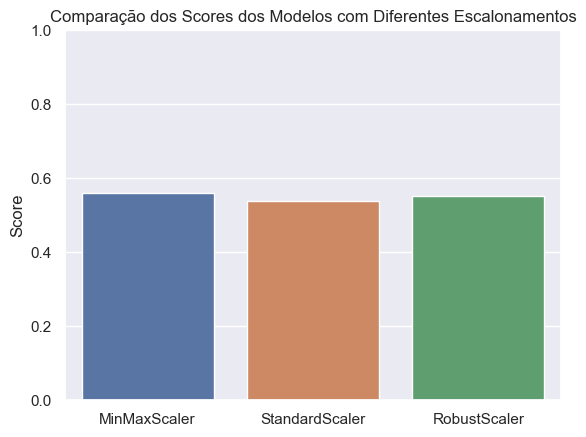

In [67]:
x = ['MinMaxScaler', 'StandardScaler', 'RobustScaler']
y = [score_min_max, score_scaler, score_robust]

sns.barplot(x=x, y=y)
plt.title('Comparação dos Scores dos Modelos com Diferentes Escalonamentos')
plt.ylabel('Score')

plt.ylim(0, 1) 

plt.show()


**We going to choose MinMaxScaler**

In [68]:
# MinMax Scaler
min_max = MinMaxScaler().fit(X_train_num)

min_max_X_train7 = min_max.transform(X_train_num)
min_max_X_train7 = pd.DataFrame(min_max_X_train7, columns=X_train_num.columns, index=X_train_num.index)

min_max_X_val7 = min_max.transform(X_val_num)
min_max_X_val7 = pd.DataFrame(min_max_X_val7, columns=X_val_num.columns, index=X_val_num.index)


In [69]:
X_train7 = pd.concat([min_max_X_train7, X_train_cat_encoded], axis=1)
X_val7 = pd.concat([min_max_X_val7, X_val_cat_encoded], axis=1)
#test7 = pd.concat([test_num, test_cat_encoded], axis=1)

# 8.Outlier Treatment

In [70]:
X_train8 = X_train7.copy()
X_val8 = X_val7.copy()

In [71]:
print(X_train8.shape)
print(X_val8.shape)


(56988, 23)
(14248, 23)


## 8.1 "Manually" filtering the dataset's outliers

In [72]:
X_train8.loc[X_train8['inpatient_visits_in_previous_year'] > 0.90476, 'inpatient_visits_in_previous_year'] = np.nan
X_val8.loc[X_val8['inpatient_visits_in_previous_year'] > 0.90476, 'inpatient_visits_in_previous_year'] = np.nan

X_train8.loc[X_train8['outpatient_visits_in_previous_year'] > 0.78571, 'outpatient_visits_in_previous_year'] = np.nan
X_val8.loc[X_val8['outpatient_visits_in_previous_year'] > 0.78571, 'outpatient_visits_in_previous_year'] = np.nan

X_train8.loc[X_train8['emergency_visits_in_previous_year'] > 0.48684, 'emergency_visits_in_previous_year'] = np.nan
X_val8.loc[X_val8['emergency_visits_in_previous_year'] > 0.48684, 'emergency_visits_in_previous_year'] = np.nan

X_train8.loc[X_train8['number_diagnoses'] > 0.86666, 'number_diagnoses'] = np.nan
X_val8.loc[X_val8['number_diagnoses'] > 0.86666, 'number_diagnoses'] = np.nan

## 8.2 Using KNN imputer 

In [73]:
columns_to_impute = ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year',
                      'inpatient_visits_in_previous_year', 'number_diagnoses']

imputer = KNNImputer(n_neighbors=5, weights="uniform")
imputer.fit(X_train8[columns_to_impute])

X_train8[columns_to_impute] = imputer.transform(X_train8[columns_to_impute])

X_val8[columns_to_impute] = imputer.transform(X_val8[columns_to_impute])

# 9.Feature Selection

## 9.1. Filter methods


### 9.1.1. Univariate variables

In [74]:
min_max_X_train7.var()

outpatient_visits_in_previous_year    0.000938
emergency_visits_in_previous_year     0.000137
inpatient_visits_in_previous_year     0.003696
average_pulse_bpm                     0.084991
length_of_stay_in_hospital            0.053007
number_diagnoses                      0.016718
discharged_home_binary                0.240564
number_of_visits                      0.002930
procedures                            0.019747
primary_diagnosis_icd9                0.060951
secondary_diagnosis_icd9              0.046910
additional_diagnosis_icd9             0.055682
dtype: float64

### 9.1.2. Correlation indices
    

**Spearman Correlation**

In [75]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

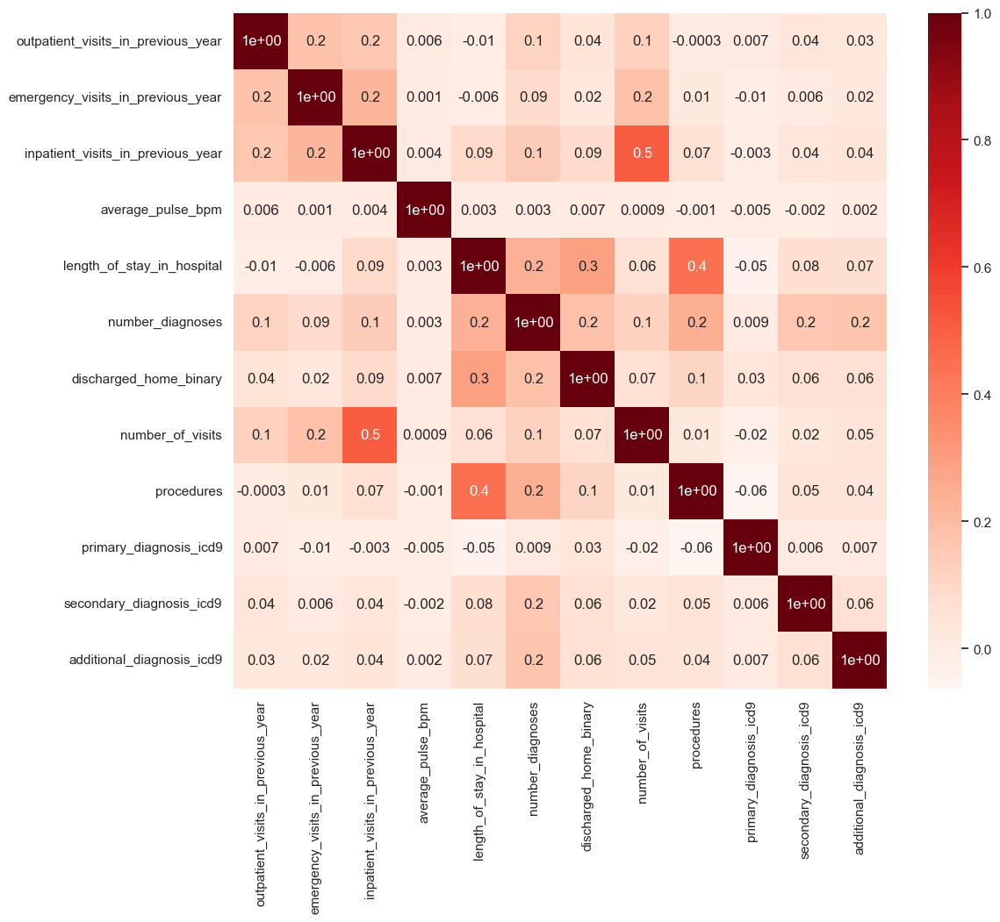

In [76]:
correlation_matrix = min_max_X_train7.corr(method='spearman')
cor_heatmap(correlation_matrix)

### 9.1.3 ANOVA

In [77]:
f_scores, p_values = f_classif(min_max_X_train7, y_train)

anova_results = pd.DataFrame({'Feature': min_max_X_train7.columns, 'F-Score': f_scores, 'P-Value': p_values})

anova_results = anova_results.sort_values(by='F-Score', ascending=False)

print(anova_results)

                               Feature      F-Score        P-Value
7                     number_of_visits  4179.147499   0.000000e+00
2    inpatient_visits_in_previous_year  1717.991002   0.000000e+00
5                     number_diagnoses   394.494020  7.057373e-171
1    emergency_visits_in_previous_year   325.699157  2.254249e-141
0   outpatient_visits_in_previous_year   187.819384   4.997454e-82
6               discharged_home_binary   145.111046   1.377248e-63
4           length_of_stay_in_hospital    89.091963   2.334633e-39
8                           procedures    65.250594   4.947957e-29
11           additional_diagnosis_icd9    20.077180   1.921597e-09
9               primary_diagnosis_icd9     8.517014   2.002906e-04
10            secondary_diagnosis_icd9     1.101575   3.323543e-01
3                    average_pulse_bpm     0.907160   4.036748e-01


### 9.1.4 Mutual Information
https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html


In [78]:
np.random.seed(42)
mi = mutual_info_classif(X_train_cat_encoded, y_train)
mi= dict(zip(X_train_cat_encoded.columns, mi))
mi

{'race': 0.006295412755238372,
 'gender': 0.0013793376743080898,
 'age': 0.00353514601185001,
 'admission_type': 0.005528400314940063,
 'medical_specialty': 0.002054320481690519,
 'admission_source': 0.006328091958280213,
 'glucose_test_result': 0.007477095598750649,
 'a1c_test_result': 0.007215932772839384,
 'change_in_meds_during_hospitalization': 0.002202932610079422,
 'prescribed_diabetes_meds': 0.004806325922159349,
 'Medicated_Status': 0.0029080178978106996}

### 9.1.5 Chi-Square for categorical data

In [79]:
def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [80]:
for var in X_train_cat_encoded:
    TestIndependence(X_train_cat_encoded[var],y_train, var)

race is NOT an important predictor. (Discard race from model)
gender is NOT an important predictor. (Discard gender from model)
age is NOT an important predictor. (Discard age from model)
admission_type is NOT an important predictor. (Discard admission_type from model)
medical_specialty is NOT an important predictor. (Discard medical_specialty from model)
admission_source is NOT an important predictor. (Discard admission_source from model)
glucose_test_result is NOT an important predictor. (Discard glucose_test_result from model)
a1c_test_result is NOT an important predictor. (Discard a1c_test_result from model)
change_in_meds_during_hospitalization is NOT an important predictor. (Discard change_in_meds_during_hospitalization from model)
prescribed_diabetes_meds is NOT an important predictor. (Discard prescribed_diabetes_meds from model)
Medicated_Status is NOT an important predictor. (Discard Medicated_Status from model)


## 9.2. Wrapper Methods

### 9.2.1. RFE

**RFE accepts as base estimator any predictive model that has a way of determining feature importance**. In the case for this example, the base estimator we will use is a Logistic Regression, which uses coefficients as the way to determine the importance of different variables.


In [81]:
#no of features
nof_list=np.arange(1,20)            
high_score=0
#Variable to store the optimum features
nof=0           
train_score_list =[]
val_score_list = []

rus = RandomUnderSampler(random_state=42)

X_u, y_u = rus.fit_resample(min_max_X_train7,y_train)

for n in range(len(nof_list)):
    model = LogisticRegression(solver='lbfgs', random_state=42) #Se chamar LR temos q escolher o nr de variaveis so que neste dataset nao sabemos quantas sao; no loop percorre com todas e atraves do socre diz qual o melhor conjunto de variaveis
    
    rfe = RFE(estimator = model,n_features_to_select = nof_list[n])

    #Training again the model
    X_train_rfe = rfe.fit_transform(X_u, y_u)
    X_val_rfe = rfe.transform(min_max_X_val7)
    
    model.fit(X_train_rfe,y_u)

    #Obtain the scores
    #storing results on training data
    y_pred = model.predict(X_val_rfe)
    y_val_pred_converted = [0 if x == 'No' else 1 for x in y_pred]
    y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]
    train_score = f1_score(y_val_converted, y_val_pred_converted)
    print(train_score, n)
    train_score_list.append(train_score)

    #storing results on training data
    val_score = model.score(X_val_rfe,y_val)
    val_score_list.append(val_score)
    
    #check best score
    if(train_score >= high_score):
        high_score = train_score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

0.37532073711219965 0
0.3763691447215101 1
0.4111560953666217 2
0.4199755310866422 3
0.4255178492728074 4
0.43500054484036177 5
0.44038086994157105 6
0.44247787610619466 7
0.44235953844494774 8
0.43777753709520195 9
0.43954619124797406 10
0.4412113374286022 11
0.4412113374286022 12
0.4412113374286022 13
0.4412113374286022 14
0.4412113374286022 15
0.4412113374286022 16
0.4412113374286022 17
0.4412113374286022 18
Optimum number of features: 8
Score with 8 features: 0.442478


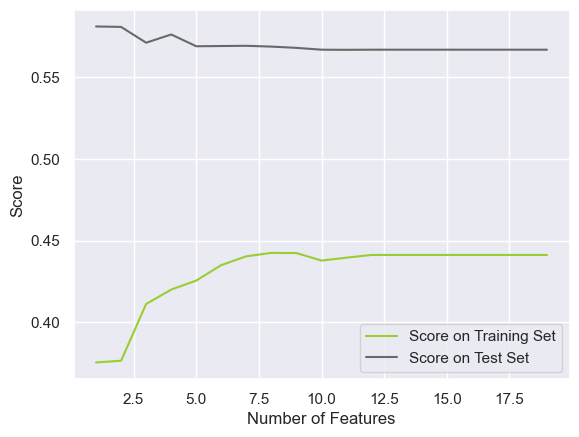

In [82]:
plt.plot(nof_list, train_score_list, label="Score on Training Set", color='yellowgreen')
plt.plot(nof_list, val_score_list, label="Score on Test Set", color='dimgray')
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend()
plt.show()

In [83]:
rfe = RFE(estimator = model, n_features_to_select = 8)
X_rfe = rfe.fit_transform(min_max_X_train7, y_train)
selected_features = pd.Series(rfe.support_, index = (min_max_X_train7.columns))
selected_features

outpatient_visits_in_previous_year     True
emergency_visits_in_previous_year      True
inpatient_visits_in_previous_year      True
average_pulse_bpm                     False
length_of_stay_in_hospital             True
number_diagnoses                       True
discharged_home_binary                 True
number_of_visits                       True
procedures                             True
primary_diagnosis_icd9                False
secondary_diagnosis_icd9              False
additional_diagnosis_icd9             False
dtype: bool

## 9.3. Embedded Methods

### 9.3.1. Lasso Regression

In [84]:
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()

In [85]:


# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_train_encoded = label_encoder.fit_transform(y_train)

# Now fit the LassoCV model with the encoded target variable
reg = LassoCV()
reg.fit(min_max_X_train7, y_train_encoded)

LassoCV()

In [86]:
coef = pd.Series(reg.coef_, index = (min_max_X_train7.columns))
coef

outpatient_visits_in_previous_year   -0.602114
emergency_visits_in_previous_year    -0.784704
inpatient_visits_in_previous_year    -0.359292
average_pulse_bpm                     0.007702
length_of_stay_in_hospital           -0.046780
number_diagnoses                     -0.340933
discharged_home_binary               -0.022297
number_of_visits                     -4.044344
procedures                           -0.084179
primary_diagnosis_icd9                0.004432
secondary_diagnosis_icd9              0.022131
additional_diagnosis_icd9            -0.009632
dtype: float64

In [87]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 12 variables and eliminated the other 0 variables


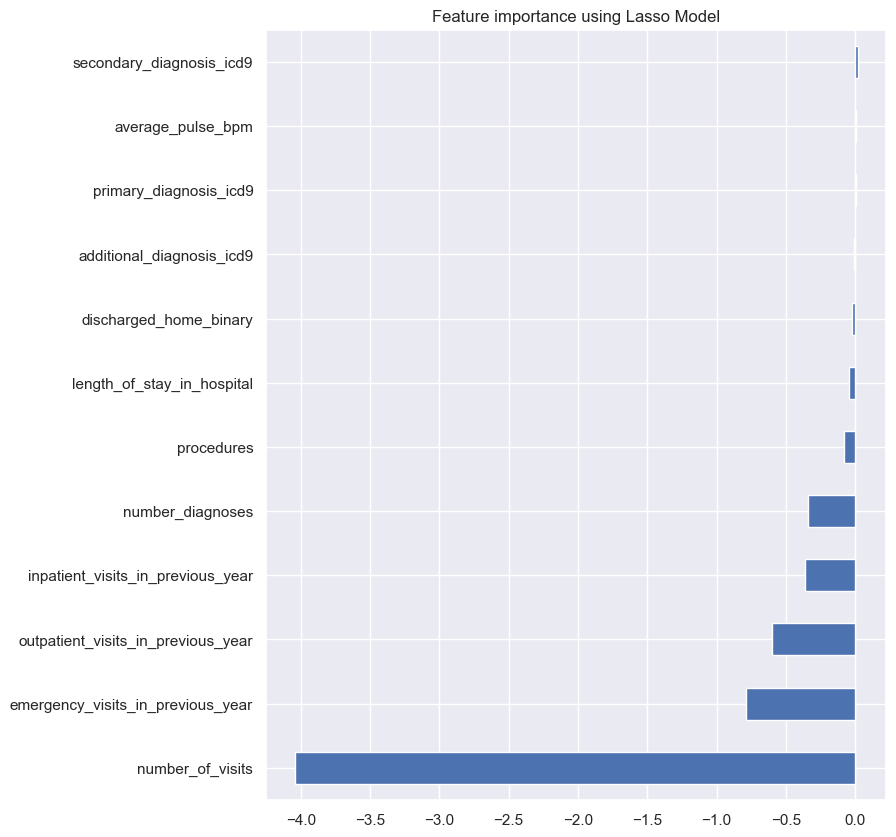

In [88]:
plot_importance(coef,'Lasso')

In [89]:
min_max_X_train7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 12 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   outpatient_visits_in_previous_year  56988 non-null  float64
 1   emergency_visits_in_previous_year   56988 non-null  float64
 2   inpatient_visits_in_previous_year   56988 non-null  float64
 3   average_pulse_bpm                   56988 non-null  float64
 4   length_of_stay_in_hospital          56988 non-null  float64
 5   number_diagnoses                    56988 non-null  float64
 6   discharged_home_binary              56988 non-null  float64
 7   number_of_visits                    56988 non-null  float64
 8   procedures                          56988 non-null  float64
 9   primary_diagnosis_icd9              56988 non-null  float64
 10  secondary_diagnosis_icd9            56988 non-null  float64
 11  additional_diagnosis_icd9           56988

## 9.4 Decision Trees

### 9.4.1 Metric Features

<Axes: xlabel='Value', ylabel='Col'>

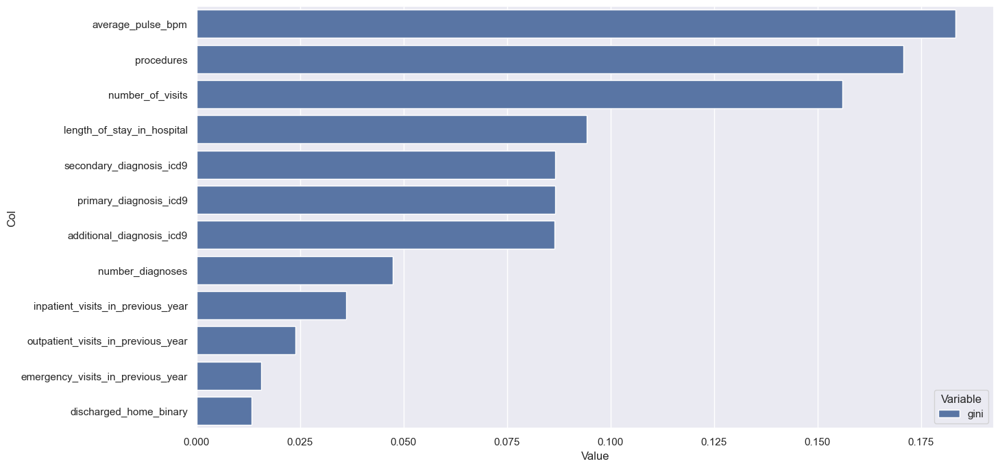

In [90]:

gini_importance = DecisionTreeClassifier().fit(min_max_X_train7, y_train).feature_importances_

zippy = pd.DataFrame(zip(gini_importance), columns = ['gini'])
zippy['col'] = min_max_X_train7.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

### 9.3.2 Non Metric Features

<Axes: xlabel='Value', ylabel='Col'>

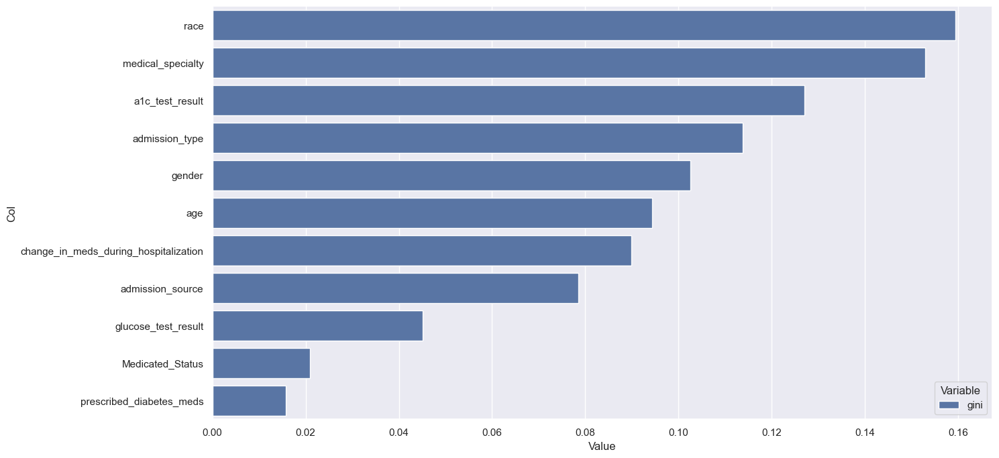

In [91]:
gini_importance = DecisionTreeClassifier().fit(X_train_cat_encoded, y_train).feature_importances_

zippy = pd.DataFrame(zip(gini_importance), columns = ['gini'])
zippy['col'] = X_train_cat_encoded.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)


## 9.5 Tables 

| Feature                              | LASSO | RFE | ANOVA | DT | Spearman | Approach |
|--------------------------------------|:-----:|:---:|:-----:|:--:|:--------:|:--------:|
| outpatient_visits_in_previous_year   |   X   |  X  |   X   |    |    X     |   Keep   |
| emergency_visits_in_previous_year    |   X   |  X   |   X   |    |    X    |   Discard   |
| inpatient_visits_in_previous_year    |   X   |  X  |   X   |    |    X     |   Keep   |
| average_pulse_bpm                    |   X   |     |       |  X |    X     | Discard  |
| length_of_stay_in_hospital           |   X   |  X  |   X   |  X |    X     |   Keep   |
| number_diagnoses                     |   X   |  X  |   X   |   |    X     |   Keep   |
| discharged_home_binary               |   X   |  X  |   X   |    |    X     |   Keep   |
| number_of_visits                     |   X   |  X  |   X   |  X |    X     |   Keep   |
| primary_diagnosis_icd9               |   X   |     |   X   |  X |    X     |   Keep   |
| secondary_diagnosis_icd9             |   X   |     |       |  X |    X     | Discard  |
| additional_diagnosis_icd9            |   X   |     |   X   |  X |    X     |   Keep   |
| procedures                           |    X   |  X   |   X    |  X  |   X       |     Keep     |


| Feature                                 | Chi-squared | Decision Tree | Mutual Information | Approach |
|:----------------------------------------|:-----------:|:-------------:|:------------------:|:--------:|
| race                                    |             |       X       |         X           |   Keep   |
| gender                                  |             |       X       |                    |   Discard   |
| age                                     |             |       X       |                    |   Discard   |
| admission_type                          |             |       X        |        X            |   Keep   |
| medical_specialty                       |             |       X       |                    |  Discard   |
| admission_source                        |             |       X       |        X            |   Keep   |
| glucose_test_result                     |             |               |        X            |   Discard   |
| a1c_test_result                         |             |       X       |       X             |   Keep   |
| change_in_meds_during_hospitalization   |             |       X       |                    | Discard  |
| prescribed_diabetes_meds                |             |               |                    | Discard  |
| medicated status                        |             |               |                    |   Discard       |


| Feature                                 | 
|:----------------------------------------|
| outpatient_visits_in_previous_year |
|    'inpatient_visits_in_previous_year |
|    'length_of_stay_in_hospital |
|    'number_diagnoses |
|    'discharged_home_binary |
|    'number_of_visits |
|    'primary_diagnosis_icd9 |
|    'additional_diagnosis_icd9 |
|    'admission_source |
|    'a1c_test_result |
 |   'procedures|
 |       'race |
|    'admission_type |   


# 10.Modelling

In [92]:
X_train9 = X_train8.copy()
X_val9 = X_val8.copy()
#data_train = df_models.copy()

In [93]:
y_train.value_counts()

readmitted_multiclass
No          30725
>30 days    19866
<30 days     6397
Name: count, dtype: int64

In [94]:
columns_to_keep = [
    'outpatient_visits_in_previous_year',
    'inpatient_visits_in_previous_year',
    'length_of_stay_in_hospital',
    'number_diagnoses',
    'discharged_home_binary',
    'number_of_visits',
    'primary_diagnosis_icd9',
    'additional_diagnosis_icd9',
    'admission_source',
    'a1c_test_result',
    'procedures',
    'race',
    'admission_type'
]

X_train8_fs = X_train9[columns_to_keep]
X_val8_fs = X_val9[columns_to_keep]


In [95]:
categorical_columns_train = []
numerical_columns_train = []

for col in X_train9.columns:
    if X_train9[col].dtype == 'object':
        categorical_columns_train.append(col)

    if X_train9[col].dtype in ['int64', 'float64', 'int32']:
        numerical_columns_train.append(col)

print("Categorical Columns in X_train8:", categorical_columns_train)
print("Numerical Columns in X_train8:", numerical_columns_train)

categorical_columns_val = []
numerical_columns_val = []

for col in X_val9.columns:
    if X_val9[col].dtype == 'object':
        categorical_columns_val.append(col)

    if X_val9[col].dtype in ['int64', 'float64', 'int32']:
        numerical_columns_val.append(col)

print("Categorical Columns in X_val8:", categorical_columns_val)
print("Numerical Columns in X_val8:", numerical_columns_val)


Categorical Columns in X_train8: []
Numerical Columns in X_train8: ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'average_pulse_bpm', 'length_of_stay_in_hospital', 'number_diagnoses', 'discharged_home_binary', 'number_of_visits', 'procedures', 'primary_diagnosis_icd9', 'secondary_diagnosis_icd9', 'additional_diagnosis_icd9', 'race', 'gender', 'age', 'admission_type', 'medical_specialty', 'admission_source', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'Medicated_Status']
Categorical Columns in X_val8: []
Numerical Columns in X_val8: ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'average_pulse_bpm', 'length_of_stay_in_hospital', 'number_diagnoses', 'discharged_home_binary', 'number_of_visits', 'procedures', 'primary_diagnosis_icd9', 'secondary_diagnosis_icd9', 'additional_diagnosis_icd9', '

In [96]:
X_train8_fs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 13 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   outpatient_visits_in_previous_year  56988 non-null  float64
 1   inpatient_visits_in_previous_year   56988 non-null  float64
 2   length_of_stay_in_hospital          56988 non-null  float64
 3   number_diagnoses                    56988 non-null  float64
 4   discharged_home_binary              56988 non-null  float64
 5   number_of_visits                    56988 non-null  float64
 6   primary_diagnosis_icd9              56988 non-null  float64
 7   additional_diagnosis_icd9           56988 non-null  float64
 8   admission_source                    56988 non-null  float64
 9   a1c_test_result                     56988 non-null  float64
 10  procedures                          56988 non-null  float64
 11  race                                56988

## Undersampling

In [97]:
ru = RandomUnderSampler(random_state=42)

X_undersampled_fs, y_undersampled_fs = ru.fit_resample(X_train8_fs, y_train)


In [98]:
stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

## 10.1 Logistic Regression

In [99]:
# NA REGRESSÃO LOGISTICA A VARIÁVEL TARGET É SEMPRE CATEGÓRICA (BINÁRIA)
# ESTE MODELO É SENSIVEL AOS TIPOS DE DADOS USADOS, OU SEJA, À DIMENSIONALIDADE DO DATAFRAME
# TEMOS QUE TER ESPECIAL ATENÇÃO ÀS VARIÁVEIS CONTÍNUAS - DISCREPÂNCIAS ETC

In [100]:
def convert_the_y(y):
    retorno = []
    for i in range(0, len(y)):
        if y[i] == 'No':
            retorno.append(0)
        elif y[i] == '<30 days':
            retorno.append(1)
        else:
            retorno.append(2)
    return retorno

In [101]:
modelLR_fs = LogisticRegression(solver='lbfgs', random_state=42)

# Perform cross-validation
scores = cross_val_score(modelLR_fs, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print(scores)
mean_accuracy_lr_train_fs = scores.mean()

print("Cross-Validation Scores:", scores)
print("Mean Training Accuracy:", mean_accuracy_lr_train_fs)

# Fit the model on the training set
modelLR_fs.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting and evaluating on training set
y_train_pred = modelLR_fs.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())

accuracy_lr_train_fs = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_lr_train_fs)
print("Training Set F1 Score:", f1_train)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on validation set
y_val_pred = modelLR_fs.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)
y_val_converted = convert_the_y(y_val.to_numpy())

accuracy_lr_val_fs = accuracy_score(y_val_converted, y_val_pred_converted)
f1_val = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_lr_val_fs)
print("Validation Set F1 Score:", f1_val)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted, y_val_pred_converted))

# Confusion Matrix for Validation Set
conf_matrix_val = confusion_matrix(y_val_converted, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


[0.51341495 0.52344971 0.52084419 0.5169359  0.50521105]
Cross-Validation Scores: [0.51341495 0.52344971 0.52084419 0.5169359  0.50521105]
Mean Training Accuracy: 0.5159711612844289

Performance on the Converted Training Set:
Training Set Accuracy: 0.5172737220572143
Training Set F1 Score: 0.49193506201720955

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.84      0.65      6397
           1       0.53      0.42      0.47      6397
           2       0.48      0.29      0.36      6397

    accuracy                           0.52     19191
   macro avg       0.51      0.52      0.49     19191
weighted avg       0.51      0.52      0.49     19191


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.5676586187535093
Validation Set F1 Score: 0.5011054134190449

Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.91      0.73

## 10.2 Naive Bayes

**UnderSampling C/ FS**

In [102]:

# Initialize Gaussian Naive Bayes for multiclass with specified smoothing
modelNB_fs = GaussianNB(var_smoothing=0.0001)

# Perform cross-validation
scores = cross_val_score(modelNB_fs, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print(scores)
mean_accuracy_nb_train_fs = scores.mean()
std_accuracy = scores.std()

print("Mean Training Accuracy:", mean_accuracy_nb_train_fs)
print("Standard Deviation of Training Accuracy:", std_accuracy)

# Fit the model on the training set
modelNB_fs.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting and evaluating on training set
y_train_pred = modelNB_fs.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())

accuracy_nb_train_fs = accuracy_score(y_train_converted, y_train_pred_converted)
f1_nb_train_fs = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_nb_train_fs)
print("Training Set F1 Score:", f1_nb_train_fs)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on validation set
y_val_pred = modelNB_fs.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)
y_val_converted = convert_the_y(y_val.to_numpy())

accuracy_nb_val_fs = accuracy_score(y_val_converted, y_val_pred_converted)
f1_nb_val_fs = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_nb_val_fs)
print("Validation Set F1 Score:", f1_nb_val_fs)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted, y_val_pred_converted))

# Confusion Matrix for Validation Set
conf_matrix_val = confusion_matrix(y_val_converted, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


[0.45324303 0.46091714 0.45700886 0.46326212 0.4447629 ]
Mean Training Accuracy: 0.4558388096387681
Standard Deviation of Training Accuracy: 0.006506579217913158

Performance on the Converted Training Set:
Training Set Accuracy: 0.4577145536970455
Training Set F1 Score: 0.4099608629312454

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.90      0.59      6397
           1       0.56      0.24      0.34      6397
           2       0.45      0.23      0.30      6397

    accuracy                           0.46     19191
   macro avg       0.49      0.46      0.41     19191
weighted avg       0.49      0.46      0.41     19191


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.5607804604154969
Validation Set F1 Score: 0.4868203106836663

Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.91      0.71      7680
          

## 10.3 KNN Classifier

In [103]:
# Define the range of neighbors, algorithms, weights, and metrics
numberK_list = np.arange(1, 5)
algorithms = ['auto', 'ball_tree', 'kd_tree', 'brute']
weights = ['uniform', 'distance']
metrics = ['euclidean', 'manhattan', 'minkowski']

# Initialize variables to store the best parameters and their score
best_score = 0
best_f1 = 0
best_params = {}

# Convert 'No'/'Yes' to 0/1 for y_val
y_val_binary = [0 if x == 'No' else 1 for x in y_val]

# Iterate over all combinations of parameters
for algorithm in algorithms:
    for weight in weights:
        for metric in metrics:
            for n in numberK_list:
                model = KNeighborsClassifier(n_neighbors=n, algorithm=algorithm, weights=weight, metric=metric)
                model.fit(X_undersampled_fs, y_undersampled_fs)
                y_val_pred = model.predict(X_val8_fs)

                # Convert 'No'/'Yes' to 0/1 for y_val_pred
                y_val_pred_binary = [0 if x == 'No' else 1 for x in y_val_pred]

                # Calculate accuracy and F1 score
                score_val = accuracy_score(y_val_binary, y_val_pred_binary)
                f1_val = f1_score(y_val_binary, y_val_pred_binary)

                # Update the best parameters if current F1 score is higher
                if f1_val > best_f1:
                    best_f1 = f1_val
                    best_score = score_val
                    best_params = {'n_neighbors': n, 'algorithm': algorithm, 'weights': weight, 'metric': metric}

# Print the best parameters and their scores
print("Best combination of parameters:")
print("Number of Neighbors:", best_params['n_neighbors'])
print("Algorithm:", best_params['algorithm'])
print("Weight Type:", best_params['weights'])
print("Distance Metric:", best_params['metric'])
print("Validation Accuracy:", best_score)
print("Best F1 Score:", best_f1)

Best combination of parameters:
Number of Neighbors: 2
Algorithm: ball_tree
Weight Type: uniform
Distance Metric: euclidean
Validation Accuracy: 0.5049129702414374
Best F1 Score: 0.6116494164280996


In [104]:
modelKNN = KNeighborsClassifier(n_neighbors=2, algorithm='ball_tree', weights='uniform', metric='euclidean')

# Perform cross-validation
scores = cross_val_score(modelKNN, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print(scores)
mean_accuracy_knn_train = scores.mean()
std_accuracy = scores.std()

print("Cross-Validation Scores:", scores)
print("Mean Training Accuracy:", mean_accuracy_knn_train)
print("Standard Deviation of Training Accuracy:", std_accuracy)

# Fit the model on the training set
modelKNN.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting and evaluating on training set
y_train_pred = modelKNN.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())

accuracy_knn_train = accuracy_score(y_train_converted, y_train_pred_converted)
f1_knn_train = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_knn_train)
print("Training Set F1 Score:", f1_knn_train)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on validation set
y_val_pred = modelKNN.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)
y_val_converted = convert_the_y(y_val.to_numpy())

accuracy_knn_val = accuracy_score(y_val_converted, y_val_pred_converted)
f1_knn_val = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_knn_val)
print("Validation Set F1 Score:", f1_knn_val)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted, y_val_pred_converted))

# Confusion Matrix for Validation Set
conf_matrix_val = confusion_matrix(y_val_converted, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


[0.37249284 0.37884315 0.37675873 0.36998437 0.37102658]
Cross-Validation Scores: [0.37249284 0.37884315 0.37675873 0.36998437 0.37102658]
Mean Training Accuracy: 0.37382113117057447
Standard Deviation of Training Accuracy: 0.0034101257801105065

Performance on the Converted Training Set:
Training Set Accuracy: 0.7105935073732479
Training Set F1 Score: 0.6966396795858695

Training Set Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.46      0.63      6397
           1       0.63      1.00      0.78      6397
           2       0.70      0.68      0.69      6397

    accuracy                           0.71     19191
   macro avg       0.78      0.71      0.70     19191
weighted avg       0.78      0.71      0.70     19191


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.2941465468837732
Validation Set F1 Score: 0.3159872770251708

Validation Set Classification Report:
              precision    recall  

## 10.4 MLP Classifier

In [105]:
def evaluate_model(model, X_train, y_train, X_val, y_val):
    skf = StratifiedKFold(n_splits=10)
    scores_train = []
    scores_val = []
    times = []
    n_iters = []
    
    for train_index, val_index in skf.split(X_train, y_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
        
        start_time = time.perf_counter()
        model.fit(X_train_fold, y_train_fold)
        end_time = time.perf_counter()
        
        train_score = model.score(X_train_fold, y_train_fold)
        val_score = model.score(X_val_fold, y_val_fold)
        n_iter = model.n_iter_
        
        scores_train.append(train_score)
        scores_val.append(val_score)
        times.append(end_time - start_time)
        n_iters.append(n_iter)
    
    avg_time = np.mean(times)
    avg_train_score = np.mean(scores_train)
    avg_val_score = np.mean(scores_val)
    avg_n_iter = np.mean(n_iters)
    
    return avg_time, avg_train_score, avg_val_score, avg_n_iter


In [106]:
# Define your models
model_simple = MLPClassifier(hidden_layer_sizes=(8), random_state=42) 
model_medium = MLPClassifier(hidden_layer_sizes=(4, 4), random_state=42) #este
model_complex = MLPClassifier(hidden_layer_sizes=(3, 3, 3), random_state=42)
model_four = MLPClassifier(hidden_layer_sizes=(4), random_state=42) 
model_simple1 = MLPClassifier(hidden_layer_sizes=(5,5), random_state=42)
model_simple2 = MLPClassifier(hidden_layer_sizes=(12), random_state=42) #este
model_simple3 = MLPClassifier(hidden_layer_sizes=(3), random_state=42)
model_simple4 = MLPClassifier(hidden_layer_sizes=(10), random_state=42) #este


# DataFrame to store results
df_varied_layers = pd.DataFrame(columns=['Time', 'Train F1 Score', 'Validation F1 Score', 'Iterations'], index=['Small Layers', 'Medium Layers', 'Large Layers', 'Extra', 'Extra1', 'Extra2', 'Extra3', 'Extra4'])

# List of models and their names
models = [model_simple, model_medium, model_complex, model_four, model_simple1, model_simple2, model_simple3, model_simple4]
model_names = ['Small Layers', 'Medium Layers', 'Large Layers', 'Extra', 'Extra1', 'Extra2', 'Extra3', 'Extra4']

for model, name in zip(models, model_names):
    avg_time, avg_train_f1_score, avg_val_f1_score, avg_n_iter = evaluate_model(model, X_undersampled_fs, y_undersampled_fs, X_val8_fs, y_val)
    df_varied_layers.loc[name] = [avg_time, avg_train_f1_score, avg_val_f1_score, avg_n_iter]

df_varied_layers


,Time,Train F1 Score,Validation F1 Score,Iterations
Small Layers,5.016543,0.525657,0.521964,198.4
Medium Layers,5.326172,0.525003,0.524205,173.2
Large Layers,1.005911,0.333333,0.333333,26.9
Extra,2.518899,0.516747,0.515815,103.6
Extra1,4.5983,0.512735,0.511386,143.8
Extra2,5.26851,0.527498,0.525664,196.0
Extra3,3.251439,0.517517,0.517743,127.4
Extra4,4.947167,0.52751,0.524726,180.6


https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

In [107]:
param_grid = {
    'hidden_layer_sizes': [(12), (10), (4,4)],
    'solver': ['lbfgs', 'adam', 'sgd'],
    'activation': ['logistic', 'tanh', 'relu'],
    'learning_rate': ['constant','adaptive'],
    'max_iter': [100,200,300],
    'learning_rate_init': [0.1, 0.01, 0.001] 
}

model = MLPClassifier(random_state=42)

grid_search = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='f1', verbose=3)

grid_search.fit(X_undersampled_fs, y_undersampled_fs)  

best_parameters = grid_search.best_params_

print("Melhores parâmetros:", best_parameters)


Fitting 5 folds for each of 486 candidates, totalling 2430 fits
[CV 1/5] END activation=logistic, hidden_layer_sizes=12, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.9s
[CV 2/5] END activation=logistic, hidden_layer_sizes=12, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.9s
[CV 3/5] END activation=logistic, hidden_layer_sizes=12, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.8s
[CV 4/5] END activation=logistic, hidden_layer_sizes=12, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.8s
[CV 5/5] END activation=logistic, hidden_layer_sizes=12, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.9s
[CV 1/5] END activation=logistic, hidden_layer_sizes=12, learning_rate=constant, learning_rate_init=0.1, max_iter=100, so

In [108]:
# Configuração do modelo MLP
modelMLP_fs = MLPClassifier(activation='logistic', hidden_layer_sizes=(12), solver='lbfgs', learning_rate_init=0.1, max_iter=100, learning_rate='constant')

# Realizando validação cruzada
scores = cross_val_score(modelMLP_fs, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print(scores)
mean_accuracy_mlp_train_fs = scores.mean()
std_accuracy = scores.std()

print("Cross-Validation Scores:", scores)
print("Mean Training Accuracy:", mean_accuracy_mlp_train_fs)
print("Standard Deviation of Training Accuracy:", std_accuracy)

# Treinando o modelo no conjunto de treinamento
modelMLP_fs.fit(X_undersampled_fs, y_undersampled_fs)

# Previsões e avaliação no conjunto de treinamento
y_train_pred = modelMLP_fs.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())

accuracy_mlp_train = accuracy_score(y_train_converted, y_train_pred_converted)
f1_mlp_train = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_mlp_train)
print("Training Set F1 Score:", f1_mlp_train)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Previsões e avaliação no conjunto de validação
y_val_pred = modelMLP_fs.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)
y_val_converted = convert_the_y(y_val.to_numpy())

accuracy_mlp_val = accuracy_score(y_val_converted, y_val_pred_converted)
f1_mlp_val = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_mlp_val)
print("Validation Set F1 Score:", f1_mlp_val)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted, y_val_pred_converted))

# Matriz de confusão para o conjunto de validação
conf_matrix_val = confusion_matrix(y_val_converted, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


[0.520969   0.52214695 0.52449192 0.51719646 0.5109432 ]
Cross-Validation Scores: [0.520969   0.52214695 0.52449192 0.51719646 0.5109432 ]
Mean Training Accuracy: 0.5191495065657976
Standard Deviation of Training Accuracy: 0.004732748296356747

Performance on the Converted Training Set:
Training Set Accuracy: 0.5212860194883018
Training Set F1 Score: 0.4926336074805868

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.84      0.66      6397
           1       0.52      0.48      0.50      6397
           2       0.48      0.24      0.32      6397

    accuracy                           0.52     19191
   macro avg       0.51      0.52      0.49     19191
weighted avg       0.51      0.52      0.49     19191


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.5673778775968557
Validation Set F1 Score: 0.5089810967532663

Validation Set Classification Report:
              precision    recall  f1

## 10.5 Decision Trees

In [109]:

param_grid = {
    'max_depth': [1, 2, 3, 4, 5, 6, 7],
    'min_samples_split': [2, 3, 4, 5, 6, 7],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7 ],
    'max_features': [None, 'auto', 'sqrt', 'log2'],
    'criterion': ['gini'],
    'splitter': ['best'],
    'max_leaf_nodes': [None, 1, 2, 3, 4, 5, 6, 7]
}

model = DecisionTreeClassifier(random_state=42)

grid_search = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='f1_weighted', verbose=3)

grid_search.fit(X_undersampled_fs, y_undersampled_fs)  

best_parameters = grid_search.best_params_
best_score = grid_search.best_score_

print("Melhores parâmetros:", best_parameters)


Fitting 5 folds for each of 9408 candidates, totalling 47040 fits
[CV 1/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.398 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.400 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.398 total time=   0.0s


[CV 4/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.394 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.397 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.398 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.400 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.398 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.394

In [110]:
modelDT = DecisionTreeClassifier(criterion='gini', max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_samples_split=6, splitter='best', random_state=42)


scores = cross_val_score(modelDT, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print(scores)
mean_accuracy_dt_train = scores.mean()
std_accuracy = scores.std()

print("Cross-Validation Scores:", scores)
print("Mean Training Accuracy:", mean_accuracy_dt_train)
print("Standard Deviation of Training Accuracy:", std_accuracy)

modelDT.fit(X_undersampled_fs, y_undersampled_fs)

y_train_pred = modelDT.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())

accuracy_dt_train = accuracy_score(y_train_converted, y_train_pred_converted)
f1_dt_train = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_dt_train)
print("Training Set F1 Score:", f1_dt_train)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

y_val_pred = modelDT.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)
y_val_converted = convert_the_y(y_val.to_numpy())

accuracy_dt_val = accuracy_score(y_val_converted, y_val_pred_converted)
f1_dt_val = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_dt_val)
print("Validation Set F1 Score:", f1_dt_val)
print("\nValidation Set Confusion Matrix:\n", confusion_matrix(y_val_converted, y_val_pred_converted))
print("\nValidation Set Classification Report:\n", classification_report(y_val_converted, y_val_pred_converted))


[0.5160198  0.52553413 0.51797811 0.51250651 0.51328817]
Cross-Validation Scores: [0.5160198  0.52553413 0.51797811 0.51250651 0.51328817]
Mean Training Accuracy: 0.5170653455030317
Standard Deviation of Training Accuracy: 0.004662545714703207

Performance on the Converted Training Set:
Training Set Accuracy: 0.5341045281642437
Training Set F1 Score: 0.5201332063105848

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.80      0.66      6397
           1       0.57      0.39      0.46      6397
           2       0.46      0.41      0.44      6397

    accuracy                           0.53     19191
   macro avg       0.53      0.53      0.52     19191
weighted avg       0.53      0.53      0.52     19191


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.5706765861875351
Validation Set F1 Score: 0.5431592146306953

Validation Set Confusion Matrix:
 [[6344  415  921]
 [ 767  318  468]
 [278

0.5172737220572143 0.4577145536970455 0.7105935073732479 0.5212860194883018 0.5341045281642437
0.5676586187535093 0.5607804604154969 0.2941465468837732 0.5673778775968557 0.5706765861875351


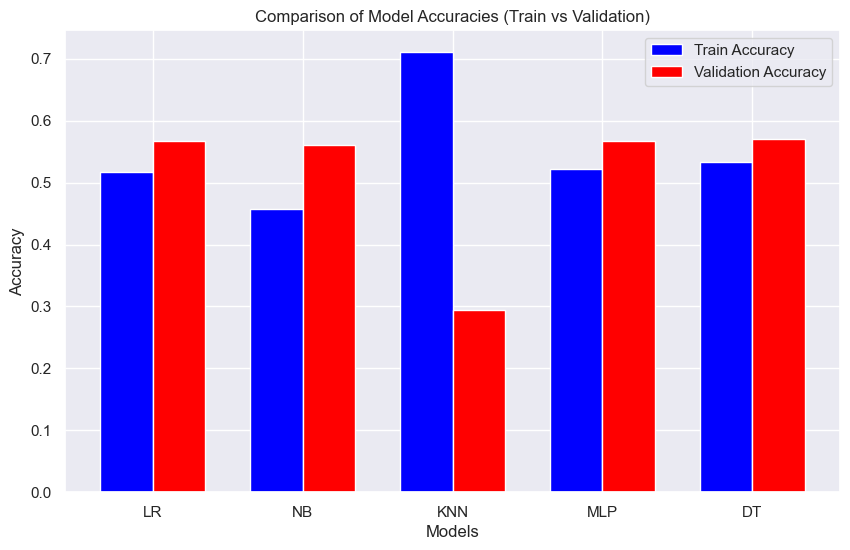

In [111]:
train_accuracies = [accuracy_lr_train_fs, 
                accuracy_nb_train_fs, 
                accuracy_knn_train, 
                accuracy_mlp_train, 
                accuracy_dt_train]

val_accuracies = [accuracy_lr_val_fs, 
            accuracy_nb_val_fs, 
            accuracy_knn_val, 
            accuracy_mlp_val, 
            accuracy_dt_val]

print(accuracy_lr_train_fs, 
                accuracy_nb_train_fs, 
                accuracy_knn_train, 
                accuracy_mlp_train, 
                accuracy_dt_train)

print(accuracy_lr_val_fs, 
            accuracy_nb_val_fs, 
            accuracy_knn_val, 
            accuracy_mlp_val, 
            accuracy_dt_val)

model_names =["LR", "NB", "KNN", "MLP", "DT"]

x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
bar_train = plt.bar(x, train_accuracies, width=bar_width, label='Train Accuracy', color='blue')
bar_val = plt.bar([i + bar_width for i in x], val_accuracies, width=bar_width, label='Validation Accuracy', color='red')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


0.49193506201720955 0.4099608629312454 0.6966396795858695 0.4926336074805868 0.5201332063105848
0.5565829423130002 0.4868203106836663 0.3159872770251708 0.5089810967532663 0.5431592146306953


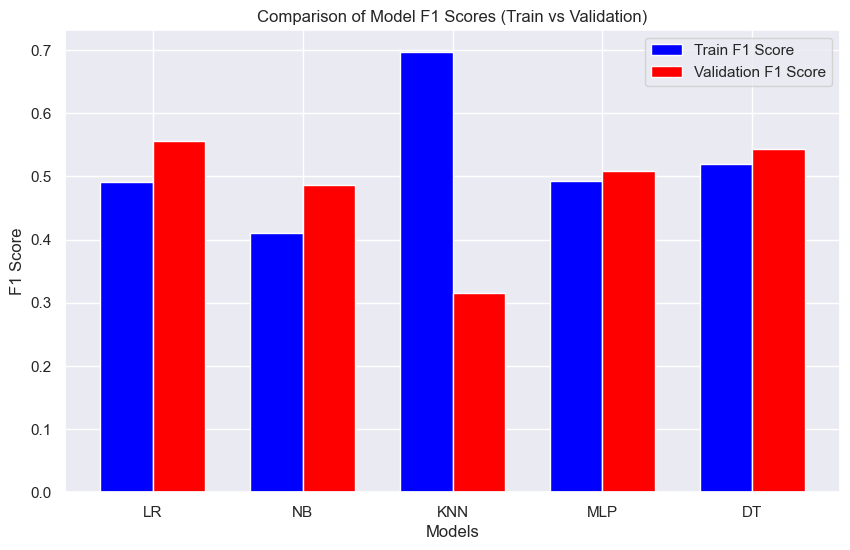

In [112]:
# F1 Scores for each model on the training set
train_f1_scores = [
    f1_train,  # Logistic Regression~
    f1_nb_train_fs,  # Naive Bayes
    f1_knn_train,  # KNN
    f1_mlp_train,  # MLP
    f1_dt_train,  # Decision Tree
]

# F1 Scores for each model on the validation set
val_f1_scores = [
    f1_val,  # Logistic Regression
    f1_nb_val_fs,  # Naive Bayes
    f1_knn_val,  # KNN
    f1_mlp_val,  # MLP
    f1_dt_val,  # Decision Tree
]
print(f1_train,  # Logistic Regression~
    f1_nb_train_fs,  # Naive Bayes
    f1_knn_train,  # KNN
    f1_mlp_train,  # MLP
    f1_dt_train  # Decision Tr
    )

print(f1_val,  # Logistic Regression
    f1_nb_val_fs,  # Naive Bayes
    f1_knn_val,  # KNN
    f1_mlp_val,  # MLP
    f1_dt_val,  # Decision Tree
    )

model_names = ["LR", "NB", "KNN", "MLP", "DT"]
x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
bar_train = plt.bar(x, train_f1_scores, width=bar_width, label='Train F1 Score', color='blue')
bar_val = plt.bar([i + bar_width for i in x], val_f1_scores, width=bar_width, label='Validation F1 Score', color='red')

plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('Comparison of Model F1 Scores (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


# 11.Ensemble

## 11.1 Bagging

### 11.1.1 RandomForestClassifier

In [113]:
max_depth = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]
n_estim = [5,6,7,8,9,10,11]
f1_scores1 = []
for i in max_depth:
    for j in n_estim:
        best_model = RandomForestClassifier(max_depth=i, n_estimators=j, random_state=42, ccp_alpha=0.0001)

        scores = cross_val_score(best_model, X_train8, y_train, cv=stratified_k_fold, scoring='f1')

       

        mean_accuracy = scores.mean()
        std_accuracy = scores.std()


        best_model.fit(X_undersampled_fs, y_undersampled_fs)

        y_val_pred = best_model.predict(X_val8_fs)
        y_val_pred_converted = convert_the_y(y_val_pred)

        y_val_converted = convert_the_y(y_val.to_numpy())


        f1_val = f1_score(y_val_converted, y_val_pred_converted, average = 'weighted')


        accuracy_val = accuracy_score(y_val_converted, y_val_pred_converted)
        confusion_val = confusion_matrix(y_val_converted, y_val_pred_converted)
        classification_rep_val = classification_report(y_val_converted, y_val_pred_converted)
        
        f1_scores1.append([f1_val,i,j])

In [114]:
f1_a = np.array(f1_scores1)
f1_r1 = [row[0] for row in f1_a]
f1_a[f1_r1.index(max(f1_r1))]

array([ 0.54093331, 10.        , 10.        ])

In [115]:
best_model = RandomForestClassifier(max_depth=10, n_estimators=10, random_state=42, ccp_alpha=0.0001)

scores = cross_val_score(best_model, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print(scores)
mean_accuracy1 = scores.mean()
std_accuracy = scores.std()

print("Cross-Validation Scores:", scores)
print("Mean Training Accuracy:", mean_accuracy1)
print("Standard Deviation of Training Accuracy:", std_accuracy)

best_model.fit(X_undersampled_fs, y_undersampled_fs)

y_train_pred = best_model.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())

accuracy_train1 = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train1 = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_train1)
print("Training Set F1 Score:", f1_train1)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

y_val_pred = best_model.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)
y_val_converted = convert_the_y(y_val.to_numpy())

accuracy_val1 = accuracy_score(y_val_converted, y_val_pred_converted)
f1_val1 = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_val1)
print("Validation Set F1 Score:", f1_val1)
print("\nValidation Set Confusion Matrix:\n", confusion_matrix(y_val_converted, y_val_pred_converted))
print("\nValidation Set Classification Report:\n", classification_report(y_val_converted, y_val_pred_converted))


[0.52357385 0.51849922 0.52162585 0.51902032 0.51902032]
Cross-Validation Scores: [0.52357385 0.51849922 0.52162585 0.51902032 0.51902032]
Mean Training Accuracy: 0.5203479117328109
Standard Deviation of Training Accuracy: 0.0019484572951465934

Performance on the Converted Training Set:
Training Set Accuracy: 0.5975717784378094
Training Set F1 Score: 0.5887830578057717

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.80      0.68      6397
           1       0.62      0.54      0.58      6397
           2       0.59      0.45      0.51      6397

    accuracy                           0.60     19191
   macro avg       0.60      0.60      0.59     19191
weighted avg       0.60      0.60      0.59     19191


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.5596574957888827
Validation Set F1 Score: 0.5409333090652663

Validation Set Confusion Matrix:
 [[6106  665  909]
 [ 725  435  393]
 [26

### 11.1.2 Bagging Classifier

In [116]:
def return_results_multiclass(models, names, x_t, y_t, x_v, y_v):
    results = []
    i = 0
    maxi = 0
    save = 0
    for model in models:
        model.fit(x_t, y_t)
        y_v_p = model.predict(x_v)
        y_val_pred_converted = convert_the_y(y_v_p)
        y_val_converted = convert_the_y(y_v.to_numpy())
        scores = f1_score(y_val_converted, y_val_pred_converted, average='weighted')
        results.append(scores)
        if maxi < scores:
            maxi = scores
            save = i
        i += 1
    print(maxi, names[save])


In [117]:
def get_models(estimator, max_samples, max_features, bootstrap):
    models = []
    names = []
    for e in estimator:
        for ms in max_samples:
            for mf in max_features:
                for b in bootstrap:
                    models.append(BaggingClassifier(estimator = e, max_samples=ms, max_features = mf, bootstrap = b , random_state = 42))
                    names.append([e, ms, mf, b])
    return models,names

In [118]:
estimator =[DecisionTreeClassifier(), KNeighborsClassifier(), None ]
max_samples = [0.1,0.2,0.4,0.6,0.8,1.0]
max_features = [0.1,0.2,0.4,0.6,0.8,1.0]
bootstrap = [True, False]
models, n = get_models(estimator, max_samples, max_features, bootstrap)
return_results_multiclass(models,n,X_undersampled_fs, y_undersampled_fs,X_val8_fs,y_val)

0.5235655840156741 [DecisionTreeClassifier(), 0.4, 0.2, True]


In [119]:
base_estimator = DecisionTreeClassifier()  # Decision Tree as the base estimator
bagging_model = BaggingClassifier(
    base_estimator=base_estimator,
    max_samples=0.4,       # 60% of the training set
    max_features=0.2,      # 20% of the features
    bootstrap=True,       # Without replacement
    random_state=42
)

# Fitting the model on the undersampled training set
bagging_model.fit(X_undersampled_fs, y_undersampled_fs)

# Converting labels to binary format
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())
y_val_converted = convert_the_y(y_val.to_numpy())

# Predicting and evaluating on the training set
y_train_pred = bagging_model.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)

accuracy_train2 = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train2 = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set (BaggingClassifier):")
print("Training Set Accuracy:", accuracy_train2)
print("Training Set F1 Score:", f1_train2)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on the validation set
y_val_pred = bagging_model.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)

accuracy_val2 = accuracy_score(y_val_converted, y_val_pred_converted)
f1_val2 = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set (BaggingClassifier):")
print("Validation Set Accuracy:", accuracy_val2)
print("Validation Set F1 Score:", f1_val2)
print("\nValidation Set Confusion Matrix:\n", confusion_matrix(y_val_converted, y_val_pred_converted))
print("\nValidation Set Classification Report:\n", classification_report(y_val_converted, y_val_pred_converted))

# Cross-validation scores
scores_bagging = cross_val_score(bagging_model, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print(scores_bagging)
mean_accuracy2 = scores_bagging.mean()
print("Mean Cross-Validation Accuracy:", mean_accuracy2)




Performance on the Converted Training Set (BaggingClassifier):
Training Set Accuracy: 0.513105101349591
Training Set F1 Score: 0.49779775968160433

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.77      0.63      6397
           1       0.51      0.44      0.47      6397
           2       0.48      0.34      0.39      6397

    accuracy                           0.51     19191
   macro avg       0.51      0.51      0.50     19191
weighted avg       0.51      0.51      0.50     19191


Performance on the Converted Validation Set (BaggingClassifier):
Validation Set Accuracy: 0.54035654126895
Validation Set F1 Score: 0.5235655840156741

Validation Set Confusion Matrix:
 [[5951  911  818]
 [ 717  476  360]
 [2621 1122 1272]]

Validation Set Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.77      0.70      7680
           1       0.19      0.31      0.23

## 11.2 Boosting

### 11.2.1 GradientBoostingClassifier

In [120]:
# Hyperparameters to tune
learning_rate = [0.001, 0.01, 0.1, 0.3, 0.5, 0.8, 1.0]
n_estimators = [2, 5, 10, 20, 30, 50, 100, 150, 200, 500]
sub_sample = [0.2, 0.4, 0.6, 0.8, 1.0]
max_features = [2, 0.5, 'sqrt', 'log2', None]

max_f1 = 0
best_params = ''

# Loop through all combinations of hyperparameters
for i in learning_rate:
    for j in n_estimators:
        for s in sub_sample:
            for m in max_features:
                gb = GradientBoostingClassifier(n_estimators=j, learning_rate=i, subsample=s, max_features=m, random_state=42)
                gb.fit(X_undersampled_fs, y_undersampled_fs)

                # Predict on the validation set
                y_val_pred = gb.predict(X_val8_fs)

                # Convert predictions and actual values using the custom function
                y_val_pred_converted = convert_the_y(y_val_pred)
                y_val_converted = convert_the_y(y_val.to_numpy())

                # Calculate F1 Score
                f1_val = f1_score(y_val_converted, y_val_pred_converted, average='weighted')
                
                # Check if this is the best score and save hyperparameters if it is
                if max_f1 < f1_val:
                    max_f1 = f1_val
                    best_params = (f'learning rate: {i}, n_estimators: {j}, subsample: {s}, max_features: {m}')

# Print the best F1 Score and corresponding hyperparameters
print(f"Best F1 Score: {max_f1}")
print(f"Best Hyperparameters: {best_params}")


Best F1 Score: 0.5523076121101913
Best Hyperparameters: learning rate: 1.0, n_estimators: 2, subsample: 0.8, max_features: 0.5


In [121]:
# Creating and fitting the GradientBoostingClassifier
gb = GradientBoostingClassifier(n_estimators=2, learning_rate=1.0, subsample=0.8, max_features=0.5, random_state=42)
gb.fit(X_undersampled_fs, y_undersampled_fs)

# Converting labels using your custom function
y_train_converted = convert_the_y(y_undersampled_fs.to_numpy())
y_val_converted = convert_the_y(y_val.to_numpy())

# Predicting and evaluating on the training set
y_train_pred = gb.predict(X_undersampled_fs)
y_train_pred_converted = convert_the_y(y_train_pred)

accuracy_train3 = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train3 = f1_score(y_train_converted, y_train_pred_converted, average='weighted')

print("\nPerformance on the Converted Training Set (GradientBoostingClassifier):")
print("Training Set Accuracy:", accuracy_train3)
print("Training Set F1 Score:", f1_train3)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on the validation set
y_val_pred = gb.predict(X_val8_fs)
y_val_pred_converted = convert_the_y(y_val_pred)

accuracy_val3 = accuracy_score(y_val_converted, y_val_pred_converted)
f1_val3 = f1_score(y_val_converted, y_val_pred_converted, average='weighted')

print("\nPerformance on the Converted Validation Set (GradientBoostingClassifier):")
print("Validation Set Accuracy:", accuracy_val3)
print("Validation Set F1 Score:", f1_val3)
print("\nValidation Set Confusion Matrix:\n", confusion_matrix(y_val_converted, y_val_pred_converted))
print("\nValidation Set Classification Report:\n", classification_report(y_val_converted, y_val_pred_converted))

# Cross-validation scores
scores_gb = cross_val_score(gb, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
mean_accuracy3 = scores_gb.mean()

print("Cross-Validation Scores (GradientBoostingClassifier):", scores_gb)
print("Mean Cross-Validation Accuracy:", mean_accuracy3)



Performance on the Converted Training Set (GradientBoostingClassifier):
Training Set Accuracy: 0.5184200927518108
Training Set F1 Score: 0.5030478363570519

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.78      0.66      6397
           1       0.53      0.33      0.41      6397
           2       0.45      0.44      0.45      6397

    accuracy                           0.52     19191
   macro avg       0.51      0.52      0.50     19191
weighted avg       0.51      0.52      0.50     19191


Performance on the Converted Validation Set (GradientBoostingClassifier):
Validation Set Accuracy: 0.5753790005614823
Validation Set F1 Score: 0.5523076121101913

Validation Set Confusion Matrix:
 [[6180  306 1194]
 [ 743  281  529]
 [2668  610 1737]]

Validation Set Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.80      0.72      7680
           1       0.23

### 11.2.2 AdaBoost

In [122]:
# Convert the labels for the undersampled training set and validation set
y_undersampled_fs_converted = convert_the_y(y_undersampled_fs.to_numpy())
y_val_converted10 = convert_the_y(y_val.to_numpy())

# Define the base estimator
base_estimator = DecisionTreeClassifier()

# Define the AdaBoost classifier
ada_boost = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1],
    'base_estimator__max_depth': [1, 2, 3]
}

# Set up GridSearchCV
grid_search = GridSearchCV(ada_boost, param_grid, cv=stratified_k_fold, scoring='f1')
grid_search.fit(X_undersampled_fs, y_undersampled_fs_converted)
best_ada_boost = grid_search.best_estimator_
print("Best parameters found: ", grid_search.best_params_)

# Cross-validation on the training set
cv_scores_train = cross_val_score(best_ada_boost, X_undersampled_fs, y_undersampled_fs_converted, cv=stratified_k_fold, scoring='accuracy')
mean_4 = cv_scores_train.mean()
print("\nCross-Validation Scores on Training Set:", cv_scores_train)
print("Mean Accuracy Score (Training):", mean_4)

# Fit the model on the entire training set
best_ada_boost.fit(X_undersampled_fs, y_undersampled_fs_converted)

# Evaluate on the training set
y_train_pred = best_ada_boost.predict(X_undersampled_fs)
accuracy_train4 = accuracy_score(y_undersampled_fs_converted, y_train_pred)
f1_train4 = f1_score(y_undersampled_fs_converted, y_train_pred, average='weighted')
print("\nPerformance on the Training Set:")
print("Training Set Accuracy:", accuracy_train4)
print("Training Set F1 Score:", f1_train4)
print("\nTraining Set Classification Report:")
print(classification_report(y_undersampled_fs_converted, y_train_pred))

# Evaluate on the validation set
y_val_pred = best_ada_boost.predict(X_val8_fs)
accuracy_val4 = accuracy_score(y_val_converted10, y_val_pred)
f1_val4 = f1_score(y_val_converted10, y_val_pred, average='weighted')
print("\nPerformance on the Validation Set:")
print("Validation Set Accuracy:", accuracy_val4)
print("Validation Set F1 Score:", f1_val4)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted10, y_val_pred))

Best parameters found:  {'base_estimator__max_depth': 1, 'learning_rate': 0.01, 'n_estimators': 50}

Cross-Validation Scores on Training Set: [0.50013024 0.50182387 0.50078166 0.49531006 0.49869724]
Mean Accuracy Score (Training): 0.49934861228544813

Performance on the Training Set:
Training Set Accuracy: 0.4993486530144339
Training Set F1 Score: 0.39737638462024927

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.86      0.65      6397
           1       0.48      0.64      0.55      6397
           2       0.00      0.00      0.00      6397

    accuracy                           0.50     19191
   macro avg       0.33      0.50      0.40     19191
weighted avg       0.33      0.50      0.40     19191


Performance on the Validation Set:
Validation Set Accuracy: 0.5435850645704661
Validation Set F1 Score: 0.4224058625088279

Validation Set Classification Report:
              precision    recall  f1-score   sup

## 11.3 Stacking

In [123]:
# Convert the labels for the undersampled training set and validation set
y_undersampled_fs_converted = convert_the_y(y_undersampled_fs.to_numpy())
y_val_converted = convert_the_y(y_val.to_numpy())

# Define your stacking classifier with base estimators
estimators = [('lg', LogisticRegression(random_state=42)),
              ('gb', GradientBoostingClassifier(n_estimators=5, learning_rate=1.0, subsample=0.2, max_features=2, random_state=42))]

meta_estimator = LogisticRegression(random_state=42)

# Create the stacking classifier
stacking = StackingClassifier(estimators=estimators, final_estimator=meta_estimator)

# Fitting the model on the undersampled training set
stacking.fit(X_undersampled_fs, y_undersampled_fs_converted)

# Predicting and evaluating on the training set
y_train_pred = stacking.predict(X_undersampled_fs)
accuracy_train5 = accuracy_score(y_undersampled_fs_converted, y_train_pred)
f1_train5 = f1_score(y_undersampled_fs_converted, y_train_pred, average='weighted')

print("\nPerformance on the Converted Training Set (StackingClassifier):")
print("Training Set Accuracy:", accuracy_train5)
print("Training Set F1 Score:", f1_train5)
print("\nTraining Set Classification Report:")
print(classification_report(y_undersampled_fs_converted, y_train_pred))

# Predicting and evaluating on the validation set
y_val_pred = stacking.predict(X_val8_fs)
accuracy_val5 = accuracy_score(y_val_converted, y_val_pred)
f1_val5 = f1_score(y_val_converted, y_val_pred, average='weighted')

print("\nPerformance on the Converted Validation Set (StackingClassifier):")
print("Validation Set Accuracy:", accuracy_val5)
print("Validation Set F1 Score:", f1_val5)
print("\nValidation Set Confusion Matrix:\n", confusion_matrix(y_val_converted, y_val_pred))
print("\nValidation Set Classification Report:\n", classification_report(y_val_converted, y_val_pred))

scores_stacking = cross_val_score(stacking, X_undersampled_fs, y_undersampled_fs_converted, cv=stratified_k_fold, scoring='accuracy')
mean_accuracy5 = scores_stacking.mean()

print("Cross-Validation Scores (StackingClassifier):", scores_stacking)
print("Mean Cross-Validation Accuracy:", mean_accuracy5)


Performance on the Converted Training Set (StackingClassifier):
Training Set Accuracy: 0.5223281746652076
Training Set F1 Score: 0.503149746460197

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.81      0.65      6397
           1       0.52      0.43      0.47      6397
           2       0.47      0.33      0.38      6397

    accuracy                           0.52     19191
   macro avg       0.51      0.52      0.50     19191
weighted avg       0.51      0.52      0.50     19191


Performance on the Converted Validation Set (StackingClassifier):
Validation Set Accuracy: 0.5729225154407637
Validation Set F1 Score: 0.5306884212480572

Validation Set Confusion Matrix:
 [[6666  393  621]
 [ 871  343  339]
 [3108  753 1154]]

Validation Set Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.87      0.73      7680
           1       0.23      0.22      0

In [124]:

# Convert the labels for the undersampled training set and validation set
y_undersampled_fs_converted = convert_the_y(y_undersampled_fs.to_numpy())
y_val_converted = convert_the_y(y_val.to_numpy())

# Define your stacking classifier with base estimators
estimators = [('lg',  MLPClassifier(activation='logistic', hidden_layer_sizes=(8), solver='lbfgs', learning_rate_init=0.1, max_iter=100, learning_rate='constant')),
              ('gb',  GradientBoostingClassifier(n_estimators=5, learning_rate=1.0, subsample=0.2, max_features=2, random_state=42))]

meta_estimator = GradientBoostingClassifier(n_estimators=5, learning_rate=1.0, subsample=0.2, max_features=2, random_state=42)

# Create the stacking classifier
stacking = StackingClassifier(estimators=estimators, final_estimator=meta_estimator)

# Fitting the model on the undersampled training set
stacking.fit(X_undersampled_fs, y_undersampled_fs_converted)

# Predicting and evaluating on the training set
y_train_pred = stacking.predict(X_undersampled_fs)
accuracy_train6 = accuracy_score(y_undersampled_fs_converted, y_train_pred)
f1_train7 = f1_score(y_undersampled_fs_converted, y_train_pred, average='weighted')

print("\nPerformance on the Converted Training Set (StackingClassifier):")
print("Training Set Accuracy:", accuracy_train6)
print("Training Set F1 Score:", f1_train7)
print("\nTraining Set Classification Report:")
print(classification_report(y_undersampled_fs_converted, y_train_pred))

# Predicting and evaluating on the validation set
y_val_pred = stacking.predict(X_val8_fs)
accuracy_val7 = accuracy_score(y_val_converted, y_val_pred)
f1_val7 = f1_score(y_val_converted, y_val_pred, average='weighted')

print("\nPerformance on the Converted Validation Set (StackingClassifier):")
print("Validation Set Accuracy:", accuracy_val7)
print("Validation Set F1 Score:", f1_val7)
print("\nValidation Set Confusion Matrix:\n", confusion_matrix(y_val_converted, y_val_pred))
print("\nValidation Set Classification Report:\n", classification_report(y_val_converted, y_val_pred))

scores_stacking = cross_val_score(stacking, X_undersampled_fs, y_undersampled_fs_converted, cv=stratified_k_fold, scoring='accuracy')
mean_accuracy7 = scores_stacking.mean()

print("Cross-Validation Scores (StackingClassifier):", scores_stacking)
print("Mean Cross-Validation Accuracy:", mean_accuracy7)


Performance on the Converted Training Set (StackingClassifier):
Training Set Accuracy: 0.48679068313271845
Training Set F1 Score: 0.4724274452376502

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.69      0.61      6397
           1       0.51      0.27      0.35      6397
           2       0.41      0.50      0.45      6397

    accuracy                           0.49     19191
   macro avg       0.49      0.49      0.47     19191
weighted avg       0.49      0.49      0.47     19191


Performance on the Converted Validation Set (StackingClassifier):
Validation Set Accuracy: 0.5466732172936553
Validation Set F1 Score: 0.5319585808039137

Validation Set Confusion Matrix:
 [[5624  380 1676]
 [ 727  237  589]
 [2562  525 1928]]

Validation Set Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.73      0.68      7680
           1       0.21      0.15     

## 11.4 Voting

In [125]:
lr = LogisticRegression(random_state=42, class_weight={0:1, 1:2, 2:3})

# Hyperparameter Tuning for RandomForest
param_grid = {'n_estimators': [50, 100, 150]}
stratified_k_fold = StratifiedKFold(n_splits=5)
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=stratified_k_fold, scoring='f1_weighted')
grid_search.fit(X_undersampled_fs, y_undersampled_fs)
rf_best = grid_search.best_estimator_

# Gradient Boosting Classifier
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Ensemble Model: Voting Classifier for multiclass
ensemble = VotingClassifier(estimators=[('rf', rf_best), ('gb', gb), ('lr', lr)], voting='soft')

# Cross-validation on the training set
cv_scores_train = cross_val_score(ensemble, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
mean_6 = cv_scores_train.mean()
print("\nCross-Validation Scores on Training Set:", cv_scores_train)
print("Mean Accuracy Score (Training):",mean_6)

# Train the ensemble model
ensemble.fit(X_undersampled_fs, y_undersampled_fs)

# Evaluate on the training set
y_train_pred = ensemble.predict(X_undersampled_fs)
accuracy_train7 = accuracy_score(y_undersampled_fs, y_train_pred)
f1_train_6 = f1_score(y_undersampled_fs, y_train_pred, average='weighted')
print("\nPerformance on the Training Set:")
print("Training Set Accuracy:", accuracy_train7)
print("Training Set F1 Score:", f1_train_6)
print("\nTraining Set Classification Report:")
print(classification_report(y_undersampled_fs, y_train_pred))
print("Training Set Confusion Matrix:\n", confusion_matrix(y_undersampled_fs, y_train_pred))

# Evaluate on the validation set
y_val_pred = ensemble.predict(X_val8_fs)
accuracy_val_6 = accuracy_score(y_val, y_val_pred)
f1_val_6 = f1_score(y_val, y_val_pred, average='weighted')
print("\nPerformance on the Validation Set:")
print("Validation Set Accuracy:", accuracy_val_6)
print("Validation Set F1 Score:", f1_val_6)
print("\nValidation Set Classification Report:")
print(classification_report(y_val, y_val_pred))
print("Validation Set Confusion Matrix:\n", confusion_matrix(y_val, y_val_pred))



Cross-Validation Scores on Training Set: [0.5160198  0.52657634 0.50729547 0.51615425 0.52397082]
Mean Accuracy Score (Training): 0.5180033340387273

Performance on the Training Set:
Training Set Accuracy: 0.8188734302537648
Training Set F1 Score: 0.8229449361102387

Training Set Classification Report:
              precision    recall  f1-score   support

    <30 days       0.97      0.74      0.84      6397
    >30 days       0.95      0.77      0.85      6397
          No       0.67      0.95      0.78      6397

    accuracy                           0.82     19191
   macro avg       0.86      0.82      0.82     19191
weighted avg       0.86      0.82      0.82     19191

Training Set Confusion Matrix:
 [[4723   83 1591]
 [  47 4899 1451]
 [ 109  195 6093]]

Performance on the Validation Set:
Validation Set Accuracy: 0.5868192026951151
Validation Set F1 Score: 0.5349787462112952

Validation Set Classification Report:
              precision    recall  f1-score   support

    <30 d

Training Accuracies: [0.5975717784378094, 0.513105101349591, 0.5184200927518108, 0.4993486530144339, 0.5223281746652076, 0.48679068313271845, 0.8188734302537648]
Validation Accuracies: [0.5596574957888827, 0.54035654126895, 0.5753790005614823, 0.5435850645704661, 0.5729225154407637, 0.5466732172936553, 0.5868192026951151]


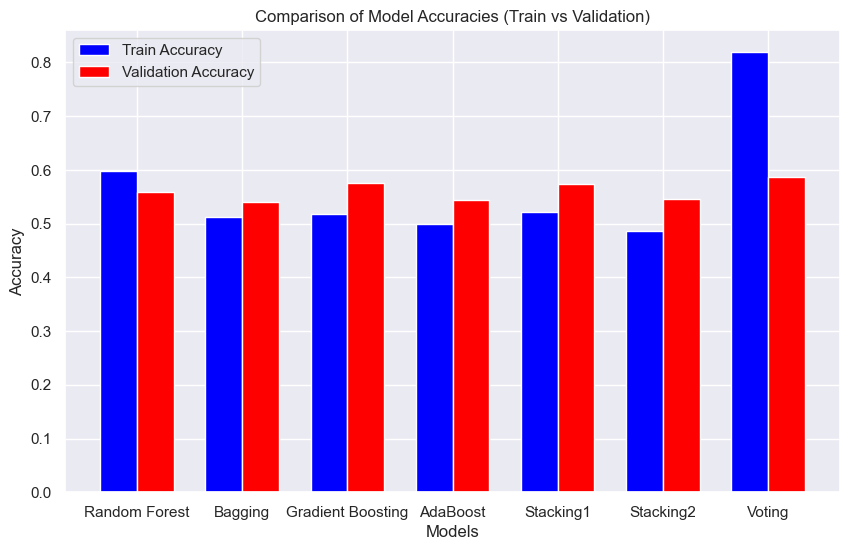

In [126]:
# Training and validation accuracies
train_accuracies = [accuracy_train1, accuracy_train2, accuracy_train3, accuracy_train4, accuracy_train5, accuracy_train6, accuracy_train7]
val_accuracies = [accuracy_val1, accuracy_val2, accuracy_val3, accuracy_val4, accuracy_val5, accuracy_val7, accuracy_val_6]

print("Training Accuracies:", train_accuracies)
print("Validation Accuracies:", val_accuracies)
model_names = ["Random Forest", "Bagging", "Gradient Boosting", "AdaBoost", "Stacking1", "Stacking2", "Voting"]

# Plotting
x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x, train_accuracies, width=bar_width, label='Train Accuracy', color='blue')
plt.bar([i + bar_width for i in x], val_accuracies, width=bar_width, label='Validation Accuracy', color='red')

# Adjusting y-axis scale
max_accuracy = max(max(train_accuracies), max(val_accuracies))
yticks = np.arange(0, max_accuracy + 0.01, 0.1)
plt.yticks(yticks)

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


Training F1: [0.5887830578057717, 0.49779775968160433, 0.5030478363570519, 0.39737638462024927, 0.503149746460197, 0.4724274452376502, 0.8229449361102387]
Validation F1: [0.5409333090652663, 0.5235655840156741, 0.5523076121101913, 0.4224058625088279, 0.5306884212480572, 0.5319585808039137, 0.5349787462112952]


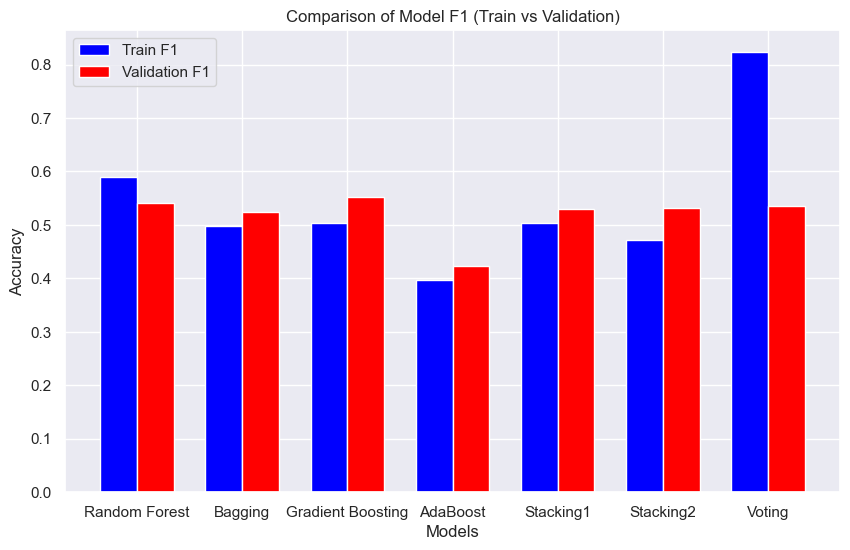

In [127]:
# Training and validation accuracies
train_accuracies = [f1_train1, f1_train2, f1_train3, f1_train4, f1_train5, f1_train7, f1_train_6]
val_accuracies = [f1_val1, f1_val2, f1_val3, f1_val4, f1_val5, f1_val7, f1_val_6]

print("Training F1:", train_accuracies)
print("Validation F1:", val_accuracies)
model_names = ["Random Forest", "Bagging", "Gradient Boosting", "AdaBoost", "Stacking1", "Stacking2", "Voting"]

# Plotting
x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x, train_accuracies, width=bar_width, label='Train F1', color='blue')
plt.bar([i + bar_width for i in x], val_accuracies, width=bar_width, label='Validation F1', color='red')

# Adjusting y-axis scale
max_accuracy = max(max(train_accuracies), max(val_accuracies))
yticks = np.arange(0, max_accuracy + 0.01, 0.1)
plt.yticks(yticks)

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Model F1 (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


| Model               |  Accuracy Train     | Accuracy Validation | F1 Train           | F1 Val             |
|---------------------|---------------------|---------------------|------------------- |--------------------|
| Logistic Regression | 0.5172737220572143  | 0.5676586187535093  | 0.49193506201720955 | 0.5011054134190449  |
| Naive Bayes         | 0.4577145536970455  | 0.5607804604154969  | 0.4099608629312454 | 0.4868203106836663  |
| KNN Classifier      | 0.7105935073732479   | 0.2941465468837732 |  0.6966396795858695 | 0.3159872770251708 |
| MLP Classifier      | 0.5212860194883018  | 0.5673778775968557   | 0.4926336074805868 | 0.5089810967532663 |
| Decision Tree       | 0.5341045281642437 | 0.5706765861875351  | 0.5201332063105848 | 0.5431592146306953|
| Random Forest       | 0.5975717784378094  | 0.5596574957888827  | 0.5887830578057717| 0.5409333090652663 |
| Bagging Classifier  | 0.513105101349591  | 0.54035654126895  | 0.49779775968160433  | 0.5235655840156741 |
| Gradient Boosting   | 0.5184200927518108 | 0.5753790005614823  | 0.5030478363570519 | 0.5523076121101913 |
| AdaBoosting         | 0.4993486530144339  | 0.5435850645704661  | 0.39737638462024927| 0.4224058625088279 |
| Stacking1           | 0.5223281746652076  | 0.5729225154407637  | 0.503149746460197 | 0.5306884212480572 |
| Stacking2           | 0.48679068313271845  | 0.5466732172936553  | 0.4724274452376502| 0.5319585808039137  |
| Voting Classifier   | 0.8188734302537648    | 0.5868192026951151  | 0.8229449361102387 | 0.5349787462112952  |

